###  The project is to do nlp analysis on movie&TV reviews. The dataset is from. I used a subset of the Amazon dataset and later used a smaller fraction of the dataset because of running time and memory limit. I ended up using 1697 rows of reviews at this point. 
### I first did text processing, filtered out digit and punctuations and then vectorized text. However, the resulting document-term matrix contained too many meaingless words and symbols, such as "zzzzzzz", "aaa", etc. So I use pos_tag before vectorization to identify words that are verbs, nouns, adjectives and adverbs and left other words out. 

In [55]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [56]:
# df=pd.read_csv('ReviewNoNull.csv')
# df

In [57]:
# df.info()

# Text Processing

In [58]:
# import re
# import string

# df['reviewText']= df['reviewText'].map(lambda x: re.sub('\d','', x))
# df['reviewText']= df['reviewText'].map(lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x))

In [59]:
# df['reviewText']

In [60]:
# df1=df.sample(frac=0.01,random_state = 2)
# df1

In [61]:
# from tqdm import tqdm
  
# for i in tqdm (range (100), desc="Loading..."):
    
#     from nltk.tag import pos_tag
#     from nltk.tokenize import word_tokenize

#     def parts_of_speech(text):
#         pos_list = pos_tag(word_tokenize(text))
#         pos = ''
#         for item in pos_list:
#             if item[1] == 'JJ' or item[1] == 'VB' or item[1] == 'NN' or item[1] =='RB':
#                 pos = pos + item[0] + ' '
#         return pos 

#     pos = df1['reviewText'].map(parts_of_speech)


In [62]:
# print(pos)

In [63]:
# df1['pos_review']=pos

In [64]:
# df1

In [65]:
# df1.to_csv('pos_review16975.csv',index=False)

In [66]:
# df=pd.read_csv('pos_review16975.csv')
# df

In [67]:
# df.pos_review.isnull().value_counts()

In [68]:
# df=df[~df.pos_review.isna()]
# df.to_csv('pos_review16905.csv',index=False)

# The Corpus

In [105]:
df=pd.read_csv('pos_review16905.csv')
df

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,pos_review
0,A3STFVPM8NHJ7B,B0006GAI5U,A. Pierre,"[0, 0]",Bernie Mac plays Stan Ross a by the books no o...,3,Mac hits a single,1221091200,"09 11, 2008",one then player beginning film middle boring c...
1,ADJ7H7A440V1W,0790740680,claudia diorio,"[0, 2]",based on earlier reviews I watched the movie b...,2,so so,1358899200,"01 23, 2013",reviews movie reason kind film audience
2,A27CFNHYZG6WS8,6303257348,darragh o'donoghue,"[120, 125]",To Yuma is a stark monochrome Western that ha...,4,From a time when men had to prove they were men.,1022025600,"05 22, 2002",stark monochrome suspense high moral tone dark...
3,A2IIOKKY2VUX4B,B002TQKL16,annette evers,"[1, 1]",Becker a laugh out loud sitcom hes rude crud...,5,netever,1291852800,"12 9, 2010",laugh loud sitcom crude yet big heart cast fun...
4,A1T9YSDAYS097M,B00005JLX8,D. Bannister,"[0, 0]",The first feature from director Dylan Kidd is ...,4,Great movie,1048550400,"03 25, 2003",first feature director knockout brilliant stro...
...,...,...,...,...,...,...,...,...,...,...
16900,A30JYEX8DVTK3Q,B00BEIYLO8,theosdoren,"[0, 0]",Why does Hollywood think crude profanity and o...,1,"Crude, Profane, Perverse",1400025600,"05 14, 2014",think crude profanity good movie wife movie ju...
16901,A3UI6CTFWL721L,B000XA5K48,"S. Naimpally ""avid music and movie fan""","[0, 0]",I caught this on cable one day and then went o...,5,"Over the top, non-stop action with a sense of ...",1279411200,"07 18, 2010",cable day then movie over again blast action w...
16902,A1YQ6QB2127AJ4,0780619250,David Anderson,"[6, 8]",Crash is one of the most unique sexual movies ...,4,Sex And Car Crashes,1068854400,"11 15, 2003",Crash unique sexual Holly movie pornography da...
16903,A3KIOOXQM0R6NA,B00008T79O,Libby,"[0, 1]",Killdozer is an enjoyable scarey movies not go...,4,Killdozer,1357344000,"01 5, 2013",enjoyable scarey not gorey movie involvedThe m...


In [106]:
corpus = list(df['pos_review'])
corpus

['one then player beginning film middle boring cliched surprise film really laugh alot watchable recommend baseball comedys ',
 'reviews movie reason kind film audience ',
 'stark monochrome suspense high moral tone darker variant role character genre usually wild joys civilisation civilisation really droughtdry farm wife often feed grind fruitless labour down identity man once shot now humiliation front family beg money indifferent wife cant understand inability be man result civilisation poor honest farmer do money fill beautiful generally whoopingitup life notcompletelyirredeemable leader gang devoted so region lawman touch Such usually sexual desire gang schmooze barmaid be match manpower ruthlessness gang rescue sheriff decoy need foolishly take bandit train station initally reluctant job reward offeredIn many hero avoid action inevitable climactic shootout as long possible centrepiece lengthy stagy sequence hotel room prisoner potential ponderousness terrific acting goading other

In [107]:
len(corpus)

16905

# WordCloud visualizing common words

In [108]:
# !pip install wordcloud

In [109]:
text=' '.join(corpus)
text

'one then player beginning film middle boring cliched surprise film really laugh alot watchable recommend baseball comedys  reviews movie reason kind film audience  stark monochrome suspense high moral tone darker variant role character genre usually wild joys civilisation civilisation really droughtdry farm wife often feed grind fruitless labour down identity man once shot now humiliation front family beg money indifferent wife cant understand inability be man result civilisation poor honest farmer do money fill beautiful generally whoopingitup life notcompletelyirredeemable leader gang devoted so region lawman touch Such usually sexual desire gang schmooze barmaid be match manpower ruthlessness gang rescue sheriff decoy need foolishly take bandit train station initally reluctant job reward offeredIn many hero avoid action inevitable climactic shootout as long possible centrepiece lengthy stagy sequence hotel room prisoner potential ponderousness terrific acting goading other crooked 

In [110]:
import nltk
from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('english')
new_stopwords = ['movie','film','youd','youll','youve', 'youre','th', 'once','aint','already','else','havent','one','see','watch',
                 'even','really','time','didnt','s','now','ab','back'
                ]

stopwords.extend(new_stopwords)
print(stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [111]:
df['pos_review'] = df['pos_review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
df['pos_review']

0        player beginning middle boring cliched surpris...
1                             reviews reason kind audience
2        stark monochrome suspense high moral tone dark...
3        laugh loud sitcom crude yet big heart cast fun...
4        first feature director knockout brilliant stro...
                               ...                        
16900    think crude profanity good wife crude profane ...
16901    cable day blast action way top first casting b...
16902    Crash unique sexual Holly pornography dangerou...
16903    enjoyable scarey gorey involvedThe good storey...
16904    Never heard pretty good wtihout show lot gore ...
Name: pos_review, Length: 16905, dtype: object

In [112]:
text=' '.join(list(df['pos_review']))

In [113]:
from collections import Counter
total_words=text.split()
word_counts = Counter(total_words)
print(len(text.split()))
print(word_counts)

720871
Counter({'good': 7323, 'great': 6301, 'story': 5544, 'much': 4527, 'first': 4520, 'well': 4505, 'also': 3960, 'get': 3393, 'way': 3292, 'many': 3165, 'series': 3157, 'show': 3013, 'little': 2883, 'never': 2746, 'life': 2733, 'still': 2727, 'character': 2726, 'make': 2319, 'love': 2303, 'end': 2175, 'bad': 2133, 'new': 1986, 'original': 1956, 'real': 1954, 'action': 1945, 'ever': 1938, 'old': 1930, 'plot': 1894, 'lot': 1876, 'scene': 1853, 'man': 1822, 'something': 1819, 'version': 1763, 'part': 1731, 'season': 1713, 'always': 1646, 'thing': 1627, 'young': 1627, 'family': 1615, 'bit': 1591, 'work': 1584, 'funny': 1551, 'long': 1547, 'say': 1545, 'music': 1537, 'pretty': 1522, 'cast': 1513, 'world': 1498, 'fun': 1485, 'enough': 1474, 'find': 1432, 'actually': 1422, 'quite': 1412, 'fan': 1396, 'go': 1379, 'role': 1372, 'right': 1347, 'last': 1327, 'performance': 1323, 'take': 1311, 'special': 1303, 'job': 1291, 'whole': 1289, 'excellent': 1284, 'big': 1273, 'different': 1272, 'book

(-0.5, 799.5, 399.5, -0.5)

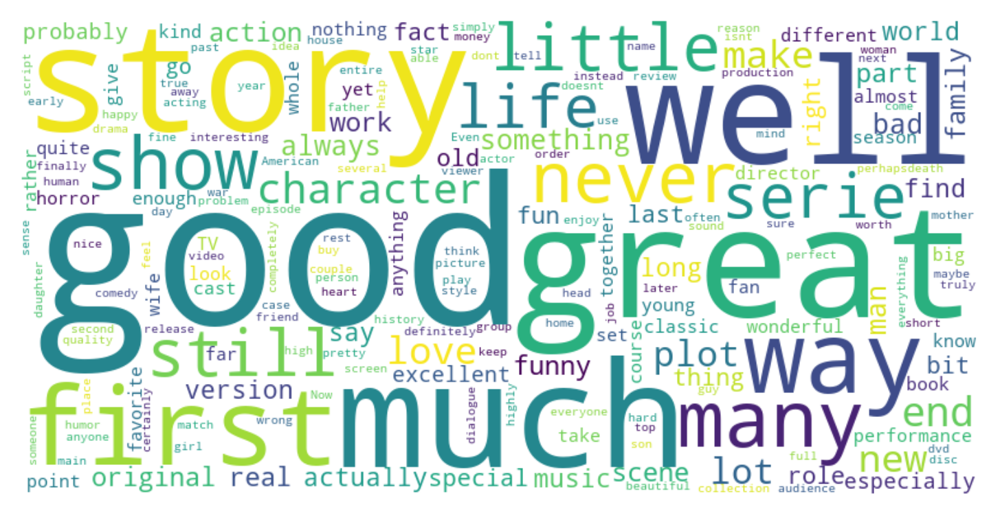

In [114]:
from wordcloud import WordCloud, STOPWORDS

# Generate a word cloud image
wordcloud = WordCloud(width=800, height=400,stopwords=set(STOPWORDS),background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(dpi=300)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

# Sentiemnt Analysis

## Vader

In [115]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
df['VaderScore'] = df['pos_review'].map(analyzer.polarity_scores).map(lambda x: x.get('compound'))

In [116]:
df[['overall','VaderScore']]

,overall,VaderScore
0,3,0.7096
1,2,0.5267
2,4,0.7234
3,5,0.8176
4,4,0.9403
...,...,...
16900,1,-0.8074
16901,5,0.9885
16902,4,0.7620
16903,4,0.8658


## Textblob

In [118]:
from textblob import TextBlob as tb
df['TextblobSentiment'] = df['pos_review'].apply(lambda x: tb(x).sentiment.polarity)

In [119]:
sentiment=df[['overall','VaderScore','TextblobSentiment']]

In [120]:
sentiment.describe()

,overall,VaderScore,TextblobSentiment
count,16905.000000,16905.000000,16905.000000
mean,4.118900,0.493459,0.203821
std,1.187792,0.563390,0.226911
min,1.000000,-0.998700,-1.000000
25%,4.000000,0.211500,0.065306
50%,5.000000,0.743000,0.186548
75%,5.000000,0.924900,0.326923
max,5.000000,0.999700,1.000000


In [121]:
sentiment['avgsen']=(sentiment.VaderScore + sentiment.TextblobSentiment)/2

/var/folders/4q/s5vk58v95472hjx15zb8y_940000gn/T/ipykernel_8916/3024078812.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sentiment['avgsen']=(sentiment.VaderScore + sentiment.TextblobSentiment)/2


In [122]:
sentiment

,overall,VaderScore,TextblobSentiment,avgsen
0,3,0.7096,-0.233333,0.238133
1,2,0.5267,0.600000,0.563350
2,4,0.7234,0.069954,0.396677
3,5,0.8176,0.108333,0.462967
4,4,0.9403,0.241667,0.590983
...,...,...,...,...
16900,1,-0.8074,-0.233333,-0.520367
16901,5,0.9885,0.249074,0.618787
16902,4,0.7620,0.141667,0.451833
16903,4,0.8658,0.294444,0.580122


In [127]:
df.overall.value_counts()

5    9043
4    3826
3    2048
1    1009
2     979
Name: overall, dtype: int64

In [129]:
x=1,2,3,4,5
y=1009,979,2048,3826,9043

(0.0, 10000.0)

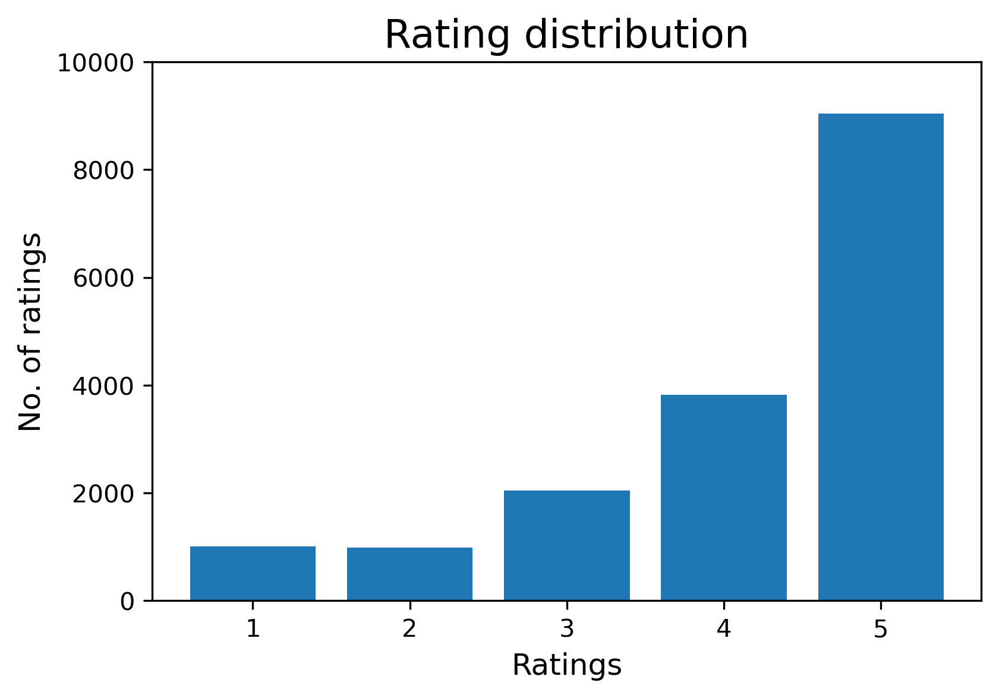

In [179]:
plt.figure(dpi=300)
plt.bar(x,y)

plt.xlabel("Ratings",fontsize=12)
plt.ylabel("No. of ratings",fontsize=12)
plt.title("Rating distribution",fontsize=16)
plt.ylim(0,10000)

In [152]:
VaderByRating=df.groupby(['overall'])['VaderScore'].mean().reset_index()
VaderByRating

,overall,VaderScore
0,1,-0.042191
1,2,0.196319
2,3,0.427040
3,4,0.537589
4,5,0.581765


(-0.2, 1.0)

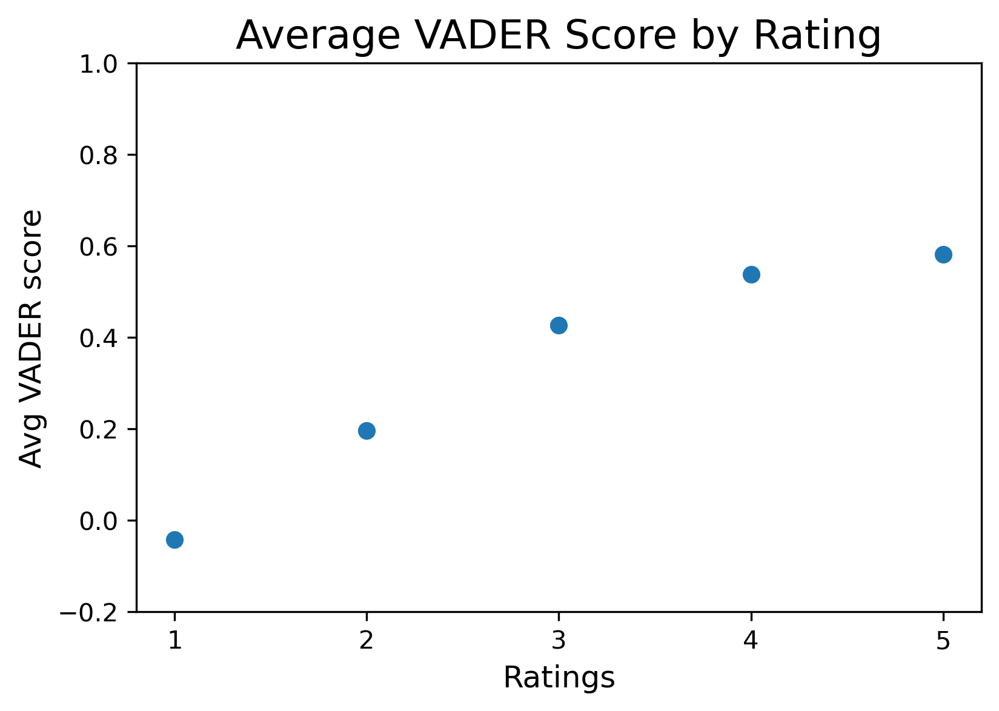

In [182]:
plt.figure(dpi=300)
plt.scatter(VaderByRating.overall,VaderByRating.VaderScore)
plt.xticks([1,2,3,4,5])

plt.xlabel("Ratings",fontsize=12)
plt.ylabel("Avg VADER score",fontsize=12)
plt.title("Average VADER Score by Rating",fontsize=16)
plt.ylim(-0.2,1)

In [95]:
# Histogram comaring true rating and VaderScore
df[['overall','VaderScore','TextblobSentiment']]

# Refining Stop Words

In [103]:
import nltk
from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('english')
new_stopwords = ['movie','film','youd','youll','youve', 'youre','th', 'once','aint','already','else','havent',
                 'one','see','watch','much','never','still'
                 'even','really','time','didnt','many','offeredIn','Such','usually','generally',
                 'st','roleHe','ol','get','wasnt','receive','byShrek','scoreI','even','isnt'
                 
                ]
stopwords.extend(new_stopwords)

df['pos_review'] = df['pos_review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))

df=df[~df.pos_review.isna()]
corpus = list(df['pos_review'])
text=' '.join(corpus)

(-0.5, 799.5, 399.5, -0.5)

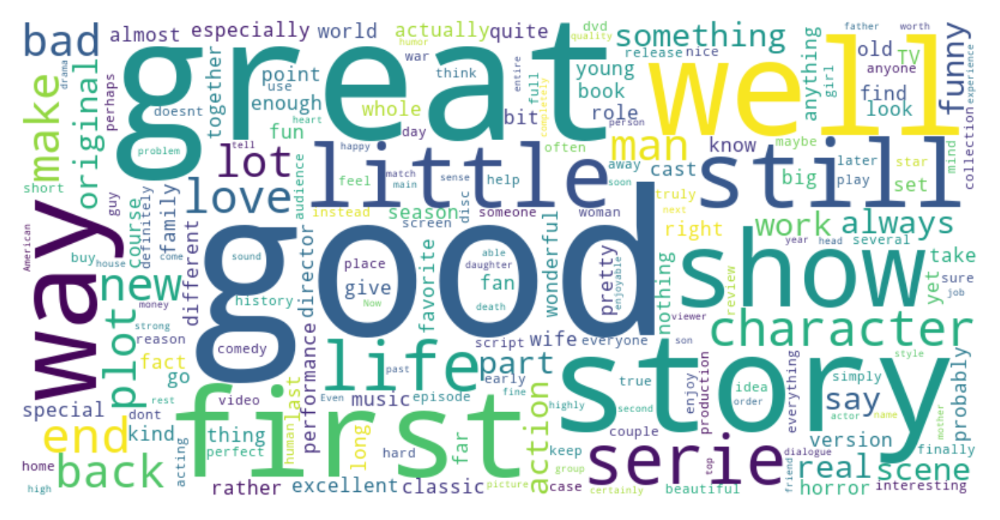

In [104]:
from wordcloud import WordCloud, STOPWORDS

# Generate a word cloud image
wordcloud = WordCloud(width=800, height=400,stopwords=set(STOPWORDS),background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(dpi=300)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

# TfidfVectorizer

In [34]:
from sklearn.feature_extraction.text import TfidfVectorizer

corpus=list(df['pos_review'])
vectorizer = TfidfVectorizer(stop_words="english", max_df=0.85, min_df=4)
doc_term = vectorizer.fit_transform(corpus)
doc_term_df = pd.DataFrame(doc_term.toarray(),columns=vectorizer.get_feature_names())
doc_term_df

,aback,abandon,abandoned,abandonment,abdominal,abduction,abhorrent,abide,ability,abject,...,zany,zeal,zeitgeist,zero,zest,zip,zombie,zone,zoo,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16900,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16901,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16902,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16903,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
# Function to display the top n terms in each topic
def display_topics(model, feature_names, no_top_words, topic_names = None): 
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix + 1)
        else:
            print("\nTopic: ", topic_names[ix])
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
    print("\n")
    return model, feature_names, no_top_words

# NMF

In [36]:
from sklearn.decomposition import NMF

nmf = NMF(4, init = "nndsvda")
nmf.fit(doc_term)

output = display_topics(nmf, vectorizer.get_feature_names(), 100)


Topic  1
way, little, bad, character, funny, life, old, action, love, lot, version, make, fun, original, real, plot, end, man, new, music, pretty, say, scene, fan, thing, family, bit, classic, actually, young, favorite, work, long, cast, special, performance, horror, job, role, big, comedy, quite, excellent, world, right, book, quality, look, enjoy, different, probably, video, kind, far, know, hard, fact, day, especially, year, wonderful, guy, collection, buy, sure, nice, course, screen, director, dont, tv, perfect, set, point, picture, actor, worth, sound, humor, star, feel, girl, reason, play, definitely, away, place, beautiful, dvd, money, think, interesting, wife, woman, doesnt, sense, release, second, home, high

Topic  2
series, tv, episode, set, fan, collection, entire, quality, complete, anime, original, excellent, price, buy, recommend, television, forward, wait, finally, british, new, enjoy, purchase, order, box, happy, highly, right, release, disc, mini, rest, condition, av

# CorEx

In [37]:
from corextopic import corextopic as ct

words = list(np.asarray(vectorizer.get_feature_names()))

topic_model = ct.Corex(n_hidden= 10, ### YOUR NUMBER OF TOPICS HERE
                       words=words,  ### YOUR VOCABULARY HERE
                       seed=1
                       )

topic_model.fit(doc_term,          ### YOUR DOCUMENT TERM MATRIX HERE
                words= words,      ### YOUR VOCABULARY HERE
                docs= df.pos_review  ### YOUR DOCUMENT SERIES HERE
                );

topics = topic_model.get_topics()
for n,topic in enumerate(topics):
    topic_words,_,_ = zip(*topic)
    print(f'{n}: {", ".join(topic_words)}')

0: scene, character, life, man, dvd, death, woman, director, role, human
1: advanced, puke, prude, province, privilege, pristine, prime, preview, precedent, posterity
2: absurdly, remiss, relive, relaxed, relatable, rectify, recorder, reasonable, realworld, ravenous
3: aback, reject, reimagining, refined, recognise, reasoning, realness, ready, reliable, razor
4: abdominal, recording, raving, rap, ranger, ramp, rag, quotyou, reese, quintessential
5: abandoned, pumpkin, prospective, props, prominence, preparation, prematurely, prehistoric, quotget, preface
6: abominable, perceive, peeks, pave, pathway, partying, partthe, pander, overview, permanent
7: aboutthe, publishing, proper, program, profanity, porno, pointy, placebut, pick, pianist
8: abouti, rebuild, reasonably, randy, radiantly, quake, psychobabble, proud, reccommend, proposal
9: acrobatic, retail, resurrection, request, reproduce, reprise, replacement, replace, relieve, retire


# LDA

In [38]:
from gensim import corpora, models, matutils
term_doc = doc_term.transpose()
corpus = matutils.Sparse2Corpus(term_doc)
id2word = dict((v, k) for k, v in vectorizer.vocabulary_.items())
lda = models.LdaModel(corpus=corpus, num_topics=3, id2word=id2word, passes=10)

In [39]:
lda.print_topics()

[(0,
  '0.019*"series" + 0.015*"season" + 0.011*"tv" + 0.010*"collection" + 0.009*"dvd" + 0.008*"buy" + 0.008*"quality" + 0.007*"set" + 0.007*"favorite" + 0.007*"fan"'),
 (1,
  '0.006*"story" + 0.003*"way" + 0.003*"little" + 0.003*"life" + 0.003*"character" + 0.003*"action" + 0.003*"bad" + 0.003*"plot" + 0.003*"real" + 0.003*"end"'),
 (2,
  '0.015*"good" + 0.010*"condition" + 0.009*"product" + 0.008*"bluray" + 0.006*"really" + 0.005*"dvds" + 0.005*"item" + 0.003*"seller" + 0.003*"rainy" + 0.003*"service"')]

In [41]:
from gensim import corpora, models, matutils
term_doc = doc_term.transpose()
corpus = matutils.Sparse2Corpus(term_doc)
id2word = dict((v, k) for k, v in vectorizer.vocabulary_.items())
lda = models.LdaModel(corpus=corpus, num_topics=4, id2word=id2word, passes=10)
lda.print_topics()

[(0,
  '0.004*"life" + 0.003*"war" + 0.002*"woman" + 0.002*"young" + 0.002*"baseball" + 0.002*"political" + 0.002*"man" + 0.002*"husband" + 0.002*"dream" + 0.002*"teen"'),
 (1,
  '0.009*"gore" + 0.008*"great" + 0.007*"ray" + 0.006*"zombie" + 0.005*"blu" + 0.004*"slasher" + 0.004*"watching" + 0.004*"gory" + 0.003*"mindless" + 0.003*"horror"'),
 (2,
  '0.017*"match" + 0.010*"just" + 0.006*"buying" + 0.004*"vs" + 0.004*"yoga" + 0.003*"replacement" + 0.003*"ad" + 0.003*"combo" + 0.003*"tire" + 0.002*"watch"'),
 (3,
  '0.007*"story" + 0.005*"series" + 0.004*"love" + 0.004*"way" + 0.004*"little" + 0.004*"action" + 0.003*"season" + 0.003*"funny" + 0.003*"old" + 0.003*"bad"')]

In [42]:
from gensim import corpora, models, matutils
term_doc = doc_term.transpose()
corpus = matutils.Sparse2Corpus(term_doc)
id2word = dict((v, k) for k, v in vectorizer.vocabulary_.items())
lda = models.LdaModel(corpus=corpus, num_topics=5, id2word=id2word, passes=20)
lda.print_topics()

[(0,
  '0.014*"series" + 0.012*"season" + 0.010*"dvd" + 0.009*"collection" + 0.009*"tv" + 0.009*"love" + 0.008*"funny" + 0.007*"recommend" + 0.007*"favorite" + 0.007*"buy"'),
 (1,
  '0.006*"story" + 0.004*"way" + 0.003*"life" + 0.003*"little" + 0.003*"character" + 0.003*"series" + 0.003*"bad" + 0.003*"love" + 0.003*"end" + 0.003*"plot"'),
 (2,
  '0.003*"gay" + 0.003*"mean" + 0.003*"agent" + 0.003*"holiday" + 0.003*"amp" + 0.003*"witty" + 0.002*"cold" + 0.002*"similar" + 0.002*"mess" + 0.002*"teenage"'),
 (3,
  '0.015*"workout" + 0.012*"bluray" + 0.012*"tape" + 0.011*"ray" + 0.008*"baseball" + 0.008*"blu" + 0.005*"grandson" + 0.004*"yoga" + 0.003*"coach" + 0.003*"exercise"'),
 (4,
  '0.014*"great" + 0.008*"amazon" + 0.005*"excited" + 0.004*"entirety" + 0.003*"disney" + 0.003*"promptly" + 0.003*"fu" + 0.003*"everytime" + 0.003*"soso" + 0.003*"marathon"')]

## Include only nouns

In [43]:
from nltk.tag import pos_tag
from nltk.tokenize import word_tokenize

from tqdm import tqdm
for i in tqdm (range (100), desc="Loading..."):
    
    def only_noun(text):
        pos_list = pos_tag(word_tokenize(text))
        noun = ''
        for item in pos_list:
            if item[1] == 'NN':
                noun = noun + item[0] + ' '
        return noun 

    nouns = df['pos_review'].map(only_noun)

Loading...: 100%|█████████████████████████████| 100/100 [51:10<00:00, 30.71s/it]


In [44]:
df['NN']=nouns
df['NN']

0             player surprise laugh alot baseball comedys 
1                                    reason kind audience 
2        monochrome suspense tone darker role character...
3                sitcom crude heart opinion crankie cynic 
4        feature director knockout addition worth price...
                               ...                        
16900                     profanity wife profane perverse 
16901    cable day action way hero woman shootout woman...
16902    car theme stunt work action car mistake realli...
16903                        scarey line recommend anyone 
16904    show lot gore ornery character attitudesI view...
Name: NN, Length: 16905, dtype: object

In [45]:
df['NN'].isnull().value_counts()

False    16905
Name: NN, dtype: int64

In [46]:
corpus = list(df['NN'])
text=' '.join(corpus)

(-0.5, 399.5, 199.5, -0.5)

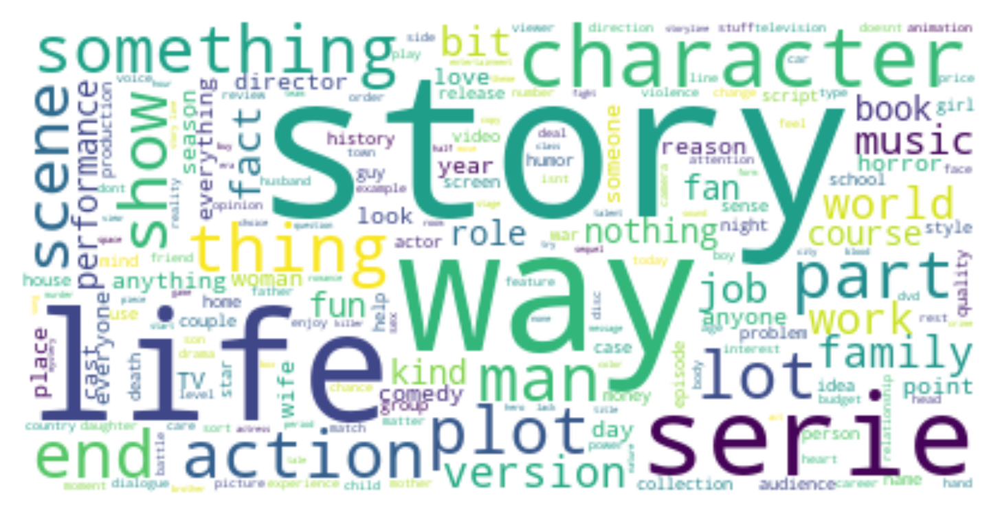

In [47]:
from wordcloud import WordCloud, STOPWORDS

# Generate a word cloud image
wordcloud = WordCloud(width=800, height=400, stopwords=set(STOPWORDS),background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(dpi=300)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

In [48]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words="english", max_df=0.85, min_df=4)
doc_term = vectorizer.fit_transform(corpus)
doc_term_df = pd.DataFrame(doc_term.toarray(),columns=vectorizer.get_feature_names())
doc_term_df

,abandonment,abduction,ability,abomination,abortion,absence,absent,absolute,absurd,absurdist,...,yuppie,zany,zeal,zeitgeist,zero,zip,zombie,zone,zoo,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16900,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16901,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16902,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16903,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [49]:
from sklearn.decomposition import NMF
nmf = NMF(4, init = "nndsvda")
nmf.fit(doc_term)

# Function to display the top n terms in each topic
def display_topics(model, feature_names, no_top_words, topic_names = None): 
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix + 1)
        else:
            print("\nTopic: ", topic_names[ix])
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
    print("\n")
    return model, feature_names, no_top_words

output = display_topics(nmf, vectorizer.get_feature_names(), 30)


Topic  1
way, action, life, family, character, version, lot, plot, music, man, end, thing, fun, fan, scene, job, book, role, performance, world, work, bit, collection, comedy, tv, quality, horror, kind, fact, love

Topic  2
series, tv, episode, fan, quality, collection, television, price, anime, order, condition, production, set, purchase, wait, animation, release, rest, mini, box, mystery, dvd, course, fun, thing, air, buy, period, program, drama

Topic  3
story, line, book, animation, end, bit, plot, love, history, job, cast, war, attention, production, scenery, recommend, heart, tell, twist, friendship, dialogue, world, boy, romance, edge, superb, period, group, development, life

Topic  4
season, episode, wait, tv, end, television, quality, year, fan, price, start, release, buy, dvd, half, favorite, love, disc, lot, cast, pilot, glad, fun, packaging, couple, character, second, set, line, volume




In [50]:
from corextopic import corextopic as ct

words = list(np.asarray(vectorizer.get_feature_names()))

topic_model = ct.Corex(n_hidden= 6, ### YOUR NUMBER OF TOPICS HERE
                       words=words,  ### YOUR VOCABULARY HERE
                       seed=1
                       )

topic_model.fit(doc_term,          ### YOUR DOCUMENT TERM MATRIX HERE
                words= words,      ### YOUR VOCABULARY HERE
                docs= df.pos_review  ### YOUR DOCUMENT SERIES HERE
                );

topics = topic_model.get_topics()
for n,topic in enumerate(topics):
    topic_words,_,_ = zip(*topic)
    print(f'{n}: {", ".join(topic_words)}')

0: scene, man, life, collection, character, woman, death, director, dvd, role
1: accurate, recollection, rebirth, razor, ratio, rare, quieter, quest, refreshing, pulse
2: abomination, obscenity, occurrence, offence, online, opinion, oscar, otherthis, owl, par
3: accompany, predictable, preference, pregnant, premature, prepubescent, preteen, proud, quake, quo
4: absurd, pre, pretty, prevalent, produce, quot, rabid, raft, railway, rapture
5: absurdist, ovation, overture, overview, pajamas, panic, pervert, petty, pie, plague


In [51]:
from gensim import corpora, models, matutils
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

term_doc = doc_term.transpose()
corpus = matutils.Sparse2Corpus(term_doc)
id2word = dict((v, k) for k, v in vectorizer.vocabulary_.items())
lda = models.LdaModel(corpus=corpus, num_topics=4, id2word=id2word, passes=10)
lda.print_topics()

2022-09-05 22:34:24,862 : INFO : using symmetric alpha at 0.25
2022-09-05 22:34:24,863 : INFO : using symmetric eta at 0.25
2022-09-05 22:34:24,864 : INFO : using serial LDA version on this node
2022-09-05 22:34:24,866 : INFO : running online (multi-pass) LDA training, 4 topics, 10 passes over the supplied corpus of 16905 documents, updating model once every 2000 documents, evaluating perplexity every 16905 documents, iterating 50x with a convergence threshold of 0.001000
2022-09-05 22:34:24,873 : INFO : PROGRESS: pass 0, at document #2000/16905
2022-09-05 22:34:25,333 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:25,334 : INFO : topic #0 (0.250): 0.015*"story" + 0.011*"way" + 0.009*"series" + 0.007*"fan" + 0.007*"life" + 0.007*"man" + 0.007*"season" + 0.007*"family" + 0.006*"tv" + 0.006*"collection"
2022-09-05 22:34:25,335 : INFO : topic #1 (0.250): 0.010*"end" + 0.007*"story" + 0.006*"character" + 0.006*"tv" + 0.006*"lot" + 0.006*"actio

2022-09-05 22:34:27,993 : INFO : topic #0 (0.250): 0.019*"story" + 0.009*"family" + 0.008*"collection" + 0.008*"way" + 0.007*"life" + 0.007*"series" + 0.007*"line" + 0.006*"plot" + 0.006*"action" + 0.006*"fan"
2022-09-05 22:34:27,993 : INFO : topic #1 (0.250): 0.014*"book" + 0.012*"recommend" + 0.011*"tv" + 0.011*"action" + 0.010*"gift" + 0.009*"condition" + 0.008*"lot" + 0.007*"story" + 0.007*"series" + 0.007*"money"
2022-09-05 22:34:27,994 : INFO : topic #2 (0.250): 0.011*"series" + 0.008*"story" + 0.006*"way" + 0.006*"character" + 0.005*"scene" + 0.005*"life" + 0.005*"music" + 0.005*"job" + 0.005*"thing" + 0.004*"war"
2022-09-05 22:34:27,994 : INFO : topic #3 (0.250): 0.013*"season" + 0.011*"version" + 0.008*"quality" + 0.008*"series" + 0.008*"story" + 0.005*"fun" + 0.005*"picture" + 0.005*"release" + 0.005*"episode" + 0.005*"wait"
2022-09-05 22:34:27,995 : INFO : topic diff=0.294057, rho=0.353553
2022-09-05 22:34:28,207 : INFO : -8.638 per-word bound, 398.4 perplexity estimate base

2022-09-05 22:34:30,256 : INFO : topic #2 (0.250): 0.008*"story" + 0.007*"series" + 0.006*"character" + 0.006*"way" + 0.005*"scene" + 0.005*"life" + 0.005*"thing" + 0.005*"horror" + 0.005*"music" + 0.004*"job"
2022-09-05 22:34:30,256 : INFO : topic #3 (0.250): 0.016*"season" + 0.014*"series" + 0.012*"version" + 0.009*"quality" + 0.007*"price" + 0.007*"story" + 0.007*"tv" + 0.006*"episode" + 0.006*"fan" + 0.006*"picture"
2022-09-05 22:34:30,257 : INFO : topic diff=0.210874, rho=0.309307
2022-09-05 22:34:30,265 : INFO : PROGRESS: pass 1, at document #14000/16905
2022-09-05 22:34:30,564 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:30,565 : INFO : topic #0 (0.250): 0.019*"story" + 0.009*"family" + 0.008*"way" + 0.007*"life" + 0.006*"line" + 0.006*"collection" + 0.006*"plot" + 0.006*"action" + 0.006*"role" + 0.006*"series"
2022-09-05 22:34:30,566 : INFO : topic #1 (0.250): 0.018*"action" + 0.017*"book" + 0.015*"tv" + 0.014*"recommend" + 0.014

2022-09-05 22:34:32,456 : INFO : PROGRESS: pass 2, at document #10000/16905
2022-09-05 22:34:32,729 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:32,730 : INFO : topic #0 (0.250): 0.018*"story" + 0.008*"family" + 0.008*"way" + 0.008*"life" + 0.006*"line" + 0.006*"love" + 0.006*"plot" + 0.006*"man" + 0.006*"role" + 0.006*"end"
2022-09-05 22:34:32,731 : INFO : topic #1 (0.250): 0.021*"action" + 0.016*"tv" + 0.016*"recommend" + 0.015*"book" + 0.015*"gift" + 0.011*"condition" + 0.010*"fun" + 0.009*"purchase" + 0.009*"waste" + 0.009*"money"
2022-09-05 22:34:32,731 : INFO : topic #2 (0.250): 0.008*"story" + 0.006*"way" + 0.006*"horror" + 0.006*"character" + 0.005*"scene" + 0.005*"thing" + 0.005*"life" + 0.005*"series" + 0.004*"war" + 0.004*"end"
2022-09-05 22:34:32,732 : INFO : topic #3 (0.250): 0.020*"season" + 0.018*"series" + 0.014*"version" + 0.011*"quality" + 0.008*"price" + 0.008*"fan" + 0.007*"episode" + 0.007*"tv" + 0.007*"release" + 0.

2022-09-05 22:34:34,717 : INFO : topic #2 (0.250): 0.007*"story" + 0.006*"thing" + 0.006*"way" + 0.006*"character" + 0.006*"horror" + 0.005*"scene" + 0.005*"life" + 0.004*"end" + 0.004*"war" + 0.004*"work"
2022-09-05 22:34:34,718 : INFO : topic #3 (0.250): 0.021*"season" + 0.020*"series" + 0.015*"version" + 0.011*"quality" + 0.009*"fan" + 0.009*"episode" + 0.008*"collection" + 0.008*"tv" + 0.008*"price" + 0.008*"release"
2022-09-05 22:34:34,718 : INFO : topic diff=0.168266, rho=0.283382
2022-09-05 22:34:34,726 : INFO : PROGRESS: pass 3, at document #8000/16905
2022-09-05 22:34:34,986 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:34,987 : INFO : topic #0 (0.250): 0.018*"story" + 0.008*"life" + 0.008*"way" + 0.007*"family" + 0.006*"character" + 0.006*"man" + 0.006*"line" + 0.006*"action" + 0.006*"plot" + 0.006*"role"
2022-09-05 22:34:34,988 : INFO : topic #1 (0.250): 0.024*"action" + 0.019*"recommend" + 0.019*"tv" + 0.015*"book" + 0.015*"fa

2022-09-05 22:34:36,636 : INFO : PROGRESS: pass 4, at document #4000/16905
2022-09-05 22:34:36,887 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:36,888 : INFO : topic #0 (0.250): 0.018*"story" + 0.009*"life" + 0.008*"way" + 0.006*"character" + 0.006*"man" + 0.006*"action" + 0.006*"line" + 0.006*"role" + 0.006*"plot" + 0.005*"end"
2022-09-05 22:34:36,889 : INFO : topic #1 (0.250): 0.027*"action" + 0.022*"family" + 0.018*"tv" + 0.016*"fun" + 0.014*"recommend" + 0.014*"condition" + 0.013*"book" + 0.013*"gift" + 0.011*"purchase" + 0.011*"series"
2022-09-05 22:34:36,889 : INFO : topic #2 (0.250): 0.007*"horror" + 0.007*"story" + 0.007*"thing" + 0.006*"way" + 0.005*"scene" + 0.005*"character" + 0.005*"end" + 0.004*"work" + 0.004*"war" + 0.004*"life"
2022-09-05 22:34:36,890 : INFO : topic #3 (0.250): 0.022*"season" + 0.021*"series" + 0.014*"version" + 0.012*"quality" + 0.011*"collection" + 0.011*"fan" + 0.009*"price" + 0.009*"episode" + 0.008*"t

2022-09-05 22:34:38,711 : INFO : topic #2 (0.250): 0.009*"horror" + 0.006*"thing" + 0.006*"story" + 0.006*"way" + 0.005*"end" + 0.005*"work" + 0.005*"scene" + 0.004*"war" + 0.004*"kind" + 0.004*"husband"
2022-09-05 22:34:38,711 : INFO : topic #3 (0.250): 0.023*"series" + 0.022*"season" + 0.015*"version" + 0.014*"collection" + 0.013*"quality" + 0.011*"fan" + 0.010*"price" + 0.009*"dvd" + 0.009*"tv" + 0.009*"episode"
2022-09-05 22:34:38,712 : INFO : topic diff=0.179555, rho=0.272646
2022-09-05 22:34:38,718 : INFO : PROGRESS: pass 5, at document #2000/16905
2022-09-05 22:34:38,964 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:38,966 : INFO : topic #0 (0.250): 0.018*"story" + 0.008*"life" + 0.008*"way" + 0.007*"character" + 0.006*"man" + 0.006*"action" + 0.006*"role" + 0.006*"line" + 0.006*"end" + 0.005*"plot"
2022-09-05 22:34:38,967 : INFO : topic #1 (0.250): 0.027*"family" + 0.025*"action" + 0.020*"tv" + 0.017*"fun" + 0.015*"recommend" + 0.

2022-09-05 22:34:40,768 : INFO : topic #0 (0.250): 0.018*"story" + 0.009*"life" + 0.007*"way" + 0.007*"character" + 0.006*"plot" + 0.006*"role" + 0.006*"line" + 0.006*"man" + 0.006*"action" + 0.005*"performance"
2022-09-05 22:34:40,768 : INFO : topic #1 (0.250): 0.030*"family" + 0.026*"action" + 0.020*"fun" + 0.019*"tv" + 0.018*"recommend" + 0.016*"gift" + 0.014*"condition" + 0.013*"book" + 0.012*"funny" + 0.011*"waste"
2022-09-05 22:34:40,769 : INFO : topic #2 (0.250): 0.008*"horror" + 0.006*"story" + 0.006*"way" + 0.006*"thing" + 0.005*"scene" + 0.005*"work" + 0.004*"sex" + 0.004*"kind" + 0.004*"husband" + 0.004*"war"
2022-09-05 22:34:40,770 : INFO : topic #3 (0.250): 0.026*"series" + 0.023*"season" + 0.016*"version" + 0.016*"collection" + 0.014*"quality" + 0.012*"fan" + 0.010*"price" + 0.009*"episode" + 0.009*"tv" + 0.009*"dvd"
2022-09-05 22:34:40,770 : INFO : topic diff=0.141380, rho=0.263044
2022-09-05 22:34:40,934 : INFO : -8.440 per-word bound, 347.3 perplexity estimate based on

2022-09-05 22:34:42,504 : INFO : topic #3 (0.250): 0.029*"series" + 0.024*"season" + 0.017*"collection" + 0.015*"version" + 0.014*"quality" + 0.013*"fan" + 0.012*"price" + 0.010*"tv" + 0.010*"episode" + 0.009*"dvd"
2022-09-05 22:34:42,505 : INFO : topic diff=0.134027, rho=0.254390
2022-09-05 22:34:42,513 : INFO : PROGRESS: pass 6, at document #14000/16905
2022-09-05 22:34:42,742 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:42,743 : INFO : topic #0 (0.250): 0.017*"story" + 0.009*"life" + 0.008*"way" + 0.008*"character" + 0.006*"plot" + 0.006*"action" + 0.006*"role" + 0.006*"man" + 0.005*"line" + 0.005*"performance"
2022-09-05 22:34:42,744 : INFO : topic #1 (0.250): 0.032*"family" + 0.027*"action" + 0.022*"fun" + 0.020*"tv" + 0.018*"recommend" + 0.017*"gift" + 0.013*"condition" + 0.011*"book" + 0.011*"funny" + 0.010*"waste"
2022-09-05 22:34:42,744 : INFO : topic #2 (0.250): 0.010*"horror" + 0.006*"way" + 0.006*"thing" + 0.006*"story" + 0.0

2022-09-05 22:34:44,421 : INFO : topic #1 (0.250): 0.032*"family" + 0.027*"action" + 0.022*"fun" + 0.019*"tv" + 0.018*"recommend" + 0.016*"gift" + 0.013*"condition" + 0.012*"love" + 0.010*"book" + 0.010*"waste"
2022-09-05 22:34:44,421 : INFO : topic #2 (0.250): 0.010*"horror" + 0.006*"story" + 0.006*"thing" + 0.006*"way" + 0.005*"husband" + 0.005*"kind" + 0.005*"sex" + 0.004*"work" + 0.004*"end" + 0.004*"war"
2022-09-05 22:34:44,422 : INFO : topic #3 (0.250): 0.030*"series" + 0.027*"season" + 0.017*"collection" + 0.017*"version" + 0.014*"quality" + 0.013*"fan" + 0.011*"price" + 0.011*"tv" + 0.011*"episode" + 0.010*"release"
2022-09-05 22:34:44,422 : INFO : topic diff=0.125172, rho=0.246538
2022-09-05 22:34:44,430 : INFO : PROGRESS: pass 7, at document #12000/16905
2022-09-05 22:34:44,660 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:44,661 : INFO : topic #0 (0.250): 0.017*"story" + 0.009*"life" + 0.008*"way" + 0.008*"character" + 0.006*"p

2022-09-05 22:34:46,093 : INFO : topic diff=0.120937, rho=0.239371
2022-09-05 22:34:46,101 : INFO : PROGRESS: pass 8, at document #8000/16905
2022-09-05 22:34:46,321 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:46,322 : INFO : topic #0 (0.250): 0.016*"story" + 0.009*"life" + 0.008*"way" + 0.008*"character" + 0.006*"action" + 0.006*"plot" + 0.006*"man" + 0.006*"role" + 0.005*"end" + 0.005*"performance"
2022-09-05 22:34:46,323 : INFO : topic #1 (0.250): 0.032*"family" + 0.028*"action" + 0.023*"fun" + 0.020*"recommend" + 0.019*"tv" + 0.015*"gift" + 0.014*"condition" + 0.013*"love" + 0.011*"book" + 0.011*"funny"
2022-09-05 22:34:46,323 : INFO : topic #2 (0.250): 0.010*"horror" + 0.006*"thing" + 0.005*"husband" + 0.005*"way" + 0.005*"story" + 0.005*"kind" + 0.004*"work" + 0.004*"sex" + 0.004*"end" + 0.004*"body"
2022-09-05 22:34:46,324 : INFO : topic #3 (0.250): 0.031*"series" + 0.028*"season" + 0.017*"collection" + 0.017*"version" + 0.014*"q

2022-09-05 22:34:48,019 : INFO : topic #2 (0.250): 0.010*"horror" + 0.007*"thing" + 0.006*"husband" + 0.005*"story" + 0.005*"way" + 0.005*"work" + 0.005*"end" + 0.004*"kind" + 0.004*"sex" + 0.004*"twist"
2022-09-05 22:34:48,020 : INFO : topic #3 (0.250): 0.031*"series" + 0.027*"season" + 0.019*"collection" + 0.015*"version" + 0.015*"quality" + 0.014*"fan" + 0.011*"price" + 0.011*"tv" + 0.011*"episode" + 0.011*"dvd"
2022-09-05 22:34:48,020 : INFO : topic diff=0.117333, rho=0.232794
2022-09-05 22:34:48,028 : INFO : PROGRESS: pass 9, at document #6000/16905
2022-09-05 22:34:48,241 : INFO : merging changes from 2000 documents into a model of 16905 documents
2022-09-05 22:34:48,242 : INFO : topic #0 (0.250): 0.017*"story" + 0.009*"life" + 0.008*"character" + 0.008*"way" + 0.006*"man" + 0.006*"plot" + 0.006*"action" + 0.006*"end" + 0.005*"role" + 0.005*"line"
2022-09-05 22:34:48,243 : INFO : topic #1 (0.250): 0.035*"family" + 0.030*"action" + 0.024*"fun" + 0.018*"tv" + 0.017*"recommend" + 0.

2022-09-05 22:34:49,629 : INFO : LdaModel lifecycle event {'msg': 'trained LdaModel<num_terms=5903, num_topics=4, decay=0.5, chunksize=2000> in 24.76s', 'datetime': '2022-09-05T22:34:49.629491', 'gensim': '4.2.0', 'python': '3.9.7 (default, Sep 16 2021, 08:50:36) \n[Clang 10.0.0 ]', 'platform': 'macOS-10.16-x86_64-i386-64bit', 'event': 'created'}
2022-09-05 22:34:49,630 : INFO : topic #0 (0.250): 0.017*"story" + 0.008*"life" + 0.008*"way" + 0.007*"character" + 0.006*"action" + 0.006*"man" + 0.006*"role" + 0.006*"plot" + 0.005*"performance" + 0.005*"line"
2022-09-05 22:34:49,630 : INFO : topic #1 (0.250): 0.034*"family" + 0.028*"action" + 0.022*"fun" + 0.017*"tv" + 0.015*"recommend" + 0.015*"love" + 0.013*"condition" + 0.013*"gift" + 0.012*"book" + 0.011*"funny"
2022-09-05 22:34:49,631 : INFO : topic #2 (0.250): 0.011*"horror" + 0.006*"thing" + 0.005*"husband" + 0.005*"story" + 0.005*"way" + 0.005*"work" + 0.005*"kind" + 0.004*"end" + 0.004*"sex" + 0.004*"body"
2022-09-05 22:34:49,631 :

[(0,
  '0.017*"story" + 0.008*"life" + 0.008*"way" + 0.007*"character" + 0.006*"action" + 0.006*"man" + 0.006*"role" + 0.006*"plot" + 0.005*"performance" + 0.005*"line"'),
 (1,
  '0.034*"family" + 0.028*"action" + 0.022*"fun" + 0.017*"tv" + 0.015*"recommend" + 0.015*"love" + 0.013*"condition" + 0.013*"gift" + 0.012*"book" + 0.011*"funny"'),
 (2,
  '0.011*"horror" + 0.006*"thing" + 0.005*"husband" + 0.005*"story" + 0.005*"way" + 0.005*"work" + 0.005*"kind" + 0.004*"end" + 0.004*"sex" + 0.004*"body"'),
 (3,
  '0.031*"series" + 0.026*"season" + 0.019*"collection" + 0.016*"version" + 0.015*"quality" + 0.014*"fan" + 0.012*"tv" + 0.012*"dvd" + 0.011*"price" + 0.011*"episode"')]

In [52]:
df.to_csv('pos_review16905_addNN.csv')

# Continue Refinning

In [186]:
df=pd.read_csv('pos_review16905_addNN.csv',index_col=0)
df.head(2)

,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,pos_review,VaderScore,TextblobSentiment,NN
reviewerID,,,,,,,,,,,,
A3STFVPM8NHJ7B,B0006GAI5U,A. Pierre,"[0, 0]",Bernie Mac plays Stan Ross a by the books no o...,3,Mac hits a single,1221091200,"09 11, 2008",player beginning middle boring cliched surpris...,0.7096,-0.233333,player surprise laugh alot baseball comedys
ADJ7H7A440V1W,0790740680,claudia diorio,"[0, 2]",based on earlier reviews I watched the movie b...,2,so so,1358899200,"01 23, 2013",reviews reason kind audience,0.5267,0.600000,reason kind audience


In [187]:
df.NN.isnull().value_counts()

False    16633
Name: NN, dtype: int64

In [188]:
df=df[~df.NN.isna()]
df.to_csv('pos_review16905_addNN.csv',index=False)

In [189]:
df=pd.read_csv('pos_review16905_addNN.csv')
corpus = list(df['NN'])
text=' '.join(corpus)

## Stopwords

In [232]:
import nltk
from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('english')
new_stopwords = ['movie','film','youd','youll','youve', 'youre','th', 'once','aint','already','else','havent',
                 'one','see','watch','story'
                 'even','really','time','didnt','good','great','many','offeredIn','Such','usually','generally',
                 'st','roleHe','ol','get','wasnt','receive','byShrek','scoreI','lot','bit','oh','job','something',
                 'reason','way','nothing','nd','im','plenty'
                 
                ]
stopwords.extend(new_stopwords)

df['NN'] = df['NN'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))

df=df[~df.NN.isna()]
corpus = list(df['NN'])
text=' '.join(corpus)

In [233]:
corpus = list(df['NN'])
text=' '.join(corpus)

(-0.5, 799.5, 399.5, -0.5)

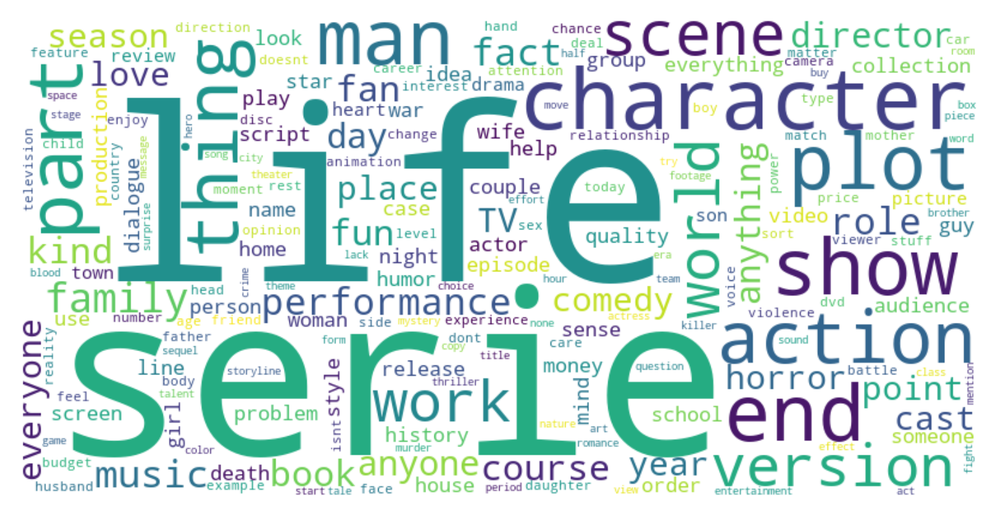

In [234]:
from wordcloud import WordCloud, STOPWORDS

# Generate a word cloud image
wordcloud = WordCloud(width=800, height=400,stopwords=set(STOPWORDS),background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(dpi=300)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

In [235]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words="english", max_df=0.85, min_df=4)
doc_term = vectorizer.fit_transform(corpus)
doc_term_df = pd.DataFrame(doc_term.toarray(),columns=vectorizer.get_feature_names())
doc_term_df

,abandonment,abduction,ability,abomination,abortion,absence,absent,absolute,absurd,absurdist,...,yuppie,zany,zeal,zeitgeist,zero,zip,zombie,zone,zoo,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16628,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16629,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16630,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16631,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## NMF

In [236]:
from sklearn.decomposition import NMF
nmf = NMF(4, init = "nndsvda")
nmf.fit(doc_term)

# Function to display the top n terms in each topic
def display_topics(model, feature_names, no_top_words, topic_names = None): 
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix + 1)
        else:
            print("\nTopic: ", topic_names[ix])
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
    print("\n")
    return model, feature_names, no_top_words

output = display_topics(nmf, vectorizer.get_feature_names(), 30)


Topic  1
family, life, version, character, end, book, music, man, plot, thing, fan, scene, performance, role, collection, world, fun, work, love, tv, quality, comedy, fact, horror, kind, day, year, cast, director, wife

Topic  2
series, tv, episode, fan, quality, television, collection, price, anime, order, condition, set, production, animation, purchase, wait, rest, release, mini, mystery, box, course, fun, air, dvd, thing, buy, period, program, crime

Topic  3
season, episode, wait, tv, end, television, quality, year, fan, price, start, buy, release, dvd, half, favorite, fun, disc, cast, love, pilot, glad, packaging, couple, second, set, volume, line, character, finale

Topic  4
action, plot, fun, line, humor, adventure, fight, violence, opinion, suspense, guy, romance, hero, role, flick, stuff, comedy, storyline, place, development, animation, cast, team, sequel, game, style, recommend, drama, dialogue, cartoon




In [238]:
nmf = NMF(10, init = "nndsvda")
nmf.fit(doc_term)

output = display_topics(nmf, vectorizer.get_feature_names(), 30)


Topic  1
life, character, end, plot, man, thing, scene, performance, music, role, world, work, kind, comedy, horror, day, love, fact, director, cast, actor, wife, fun, woman, course, year, point, line, guy, place

Topic  2
series, episode, television, quality, price, anime, order, condition, production, animation, set, fun, rest, wait, box, mini, release, thing, mystery, course, purchase, air, period, cast, drama, crime, program, scifi, volume, buy

Topic  3
season, episode, wait, end, television, year, quality, price, start, release, buy, half, favorite, cast, fun, disc, pilot, dvd, glad, packaging, love, second, line, couple, volume, set, character, finale, drama, rest

Topic  4
action, plot, fun, line, humor, adventure, opinion, fight, violence, suspense, guy, romance, hero, stuff, flick, storyline, comedy, animation, role, place, development, team, sequel, game, cast, cartoon, recommend, drama, style, excitement

Topic  5
family, fun, enjoy, night, line, entertainment, son, year, 

In [243]:
for index,topic in enumerate(nmf.components_):
    print(f'THE TOP 30 WORDS FOR TOPIC #{index}')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-30:]])
    print('\n')

THE TOP 30 WORDS FOR TOPIC #0
['place', 'guy', 'line', 'point', 'year', 'course', 'woman', 'fun', 'wife', 'actor', 'cast', 'director', 'fact', 'love', 'day', 'horror', 'comedy', 'kind', 'work', 'world', 'role', 'music', 'performance', 'scene', 'thing', 'man', 'plot', 'end', 'character', 'life']


THE TOP 30 WORDS FOR TOPIC #1
['buy', 'volume', 'scifi', 'program', 'crime', 'drama', 'cast', 'period', 'air', 'purchase', 'course', 'mystery', 'thing', 'release', 'mini', 'box', 'wait', 'rest', 'fun', 'set', 'animation', 'production', 'condition', 'order', 'anime', 'price', 'quality', 'television', 'episode', 'series']


THE TOP 30 WORDS FOR TOPIC #2
['rest', 'drama', 'finale', 'character', 'set', 'volume', 'couple', 'line', 'second', 'love', 'packaging', 'glad', 'dvd', 'pilot', 'disc', 'fun', 'cast', 'favorite', 'half', 'buy', 'release', 'start', 'price', 'quality', 'year', 'television', 'end', 'wait', 'episode', 'season']


THE TOP 30 WORDS FOR TOPIC #3
['excitement', 'style', 'drama', 'rec

In [253]:
## Creating document term matrix using TfidfVectorizer

tfidf = TfidfVectorizer(max_df=0.85,
                        min_df=3,
                        stop_words=stopwords
                        )
dtm = tfidf.fit_transform(df['NN'])

tf_feature_names = tfidf.get_feature_names()

dtm       

<16633x7376 sparse matrix of type '<class 'numpy.float64'>'
	with 249687 stored elements in Compressed Sparse Row format>

In [254]:
# creating NMF model with 10 components/topics

nmf_model = NMF(n_components=10, 
                random_state=20,
                init='nndsvd',
                #n_jobs = -1  # Use all available CPUs
                )

# fitting and transforming the dtm to obtain weights corresponding to 'belongingness' of document to each topic
topics=nmf_model.fit_transform(dtm)


In [255]:
def display_topics(model, feature_names, no_top_words):
    topic_dict = {}
    for topic_idx, topic in enumerate(model.components_):
        topic_dict["Topic %d words" % (topic_idx)]= ['{}'.format(feature_names[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
        topic_dict["Topic %d weights" % (topic_idx)]= ['{:.1f}'.format(topic[i])
                        for i in topic.argsort()[:-no_top_words - 1:-1]]
    return pd.DataFrame(topic_dict)

no_top_words = 10
display_topics(nmf_model, tf_feature_names, no_top_words)

,Topic 0 words,Topic 0 weights,Topic 1 words,Topic 1 weights,Topic 2 words,Topic 2 weights,Topic 3 words,Topic 3 weights,Topic 4 words,Topic 4 weights,Topic 5 words,Topic 5 weights,Topic 6 words,Topic 6 weights,Topic 7 words,Topic 7 weights,Topic 8 words,Topic 8 weights,Topic 9 words,Topic 9 weights
0,life,1.4,series,3.3,show,3.4,season,4.0,action,3.5,family,3.1,collection,3.1,version,2.7,tv,2.9,book,2.9
1,character,1.2,episode,0.1,fan,0.1,episode,0.6,plot,0.3,fun,0.4,fan,1.2,quality,0.3,quality,0.3,fan,0.2
2,end,0.9,television,0.1,television,0.1,wait,0.3,fun,0.3,enjoy,0.2,price,0.2,release,0.3,dvd,0.2,adaptation,0.1
3,man,0.9,fan,0.1,episode,0.1,end,0.1,line,0.2,line,0.1,addition,0.2,picture,0.2,picture,0.1,character,0.1
4,plot,0.9,anime,0.1,fun,0.1,quality,0.1,humor,0.1,night,0.1,dvd,0.2,disc,0.1,enjoy,0.1,read,0.1
5,part,0.8,quality,0.1,humor,0.1,price,0.1,adventure,0.1,everyone,0.1,music,0.2,production,0.1,today,0.1,year,0.1
6,thing,0.8,price,0.1,anyone,0.1,television,0.1,fight,0.1,entertainment,0.1,video,0.1,edition,0.1,purchase,0.1,novel,0.1
7,music,0.8,order,0.1,drama,0.1,year,0.1,opinion,0.1,son,0.1,quality,0.1,video,0.1,anything,0.1,fact,0.1
8,scene,0.8,production,0.1,cast,0.1,start,0.1,violence,0.1,love,0.1,add,0.1,buy,0.1,episode,0.1,mind,0.0
9,performance,0.8,animation,0.0,dvd,0.1,half,0.1,suspense,0.1,year,0.1,purchase,0.1,sound,0.1,sound,0.1,production,0.0


In [256]:
for index,topic in enumerate(nmf_model.components_):
    print(f'THE TOP 10 WORDS FOR TOPIC #{index}')
    print([tfidf.get_feature_names()[i] for i in topic.argsort()[-10:]])
    print('\n')

THE TOP 10 WORDS FOR TOPIC #0
['performance', 'scene', 'music', 'thing', 'part', 'plot', 'man', 'end', 'character', 'life']


THE TOP 10 WORDS FOR TOPIC #1
['animation', 'production', 'order', 'price', 'quality', 'anime', 'fan', 'television', 'episode', 'series']


THE TOP 10 WORDS FOR TOPIC #2
['dvd', 'cast', 'drama', 'anyone', 'humor', 'fun', 'episode', 'television', 'fan', 'show']


THE TOP 10 WORDS FOR TOPIC #3
['half', 'start', 'year', 'television', 'price', 'quality', 'end', 'wait', 'episode', 'season']


THE TOP 10 WORDS FOR TOPIC #4
['suspense', 'violence', 'opinion', 'fight', 'adventure', 'humor', 'line', 'fun', 'plot', 'action']


THE TOP 10 WORDS FOR TOPIC #5
['year', 'love', 'son', 'entertainment', 'everyone', 'night', 'line', 'enjoy', 'fun', 'family']


THE TOP 10 WORDS FOR TOPIC #6
['purchase', 'add', 'quality', 'video', 'music', 'dvd', 'addition', 'price', 'fan', 'collection']


THE TOP 10 WORDS FOR TOPIC #7
['sound', 'buy', 'video', 'edition', 'production', 'disc', 'pic

In [265]:
df['NMF_Topic']=topics.argmax(axis=1)

## Naming topics 

naming={0:'character_cast/director/production',
        1:'fan',
        2:'season_episode',
        3:'genre',
        4:'family_friendly',
        5:'collection_purchase',
        6:'movie/tv version',
        7:'disc quality',
        8: 'gift',
        9:'book adapation'
       }

df['NMF_Topic_name']=df['NMF_Topic'].map(naming)

df

,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime,pos_review,VaderScore,TextblobSentiment,NN,NMF_Topic,NMF_Topic_name
0,B0006GAI5U,A. Pierre,"[0, 0]",Bernie Mac plays Stan Ross a by the books no o...,3,Mac hits a single,1221091200,"09 11, 2008",player beginning middle boring cliched surpris...,0.7096,-0.233333,player surprise laugh alot baseball comedys,0,character_cast/director/production
1,0790740680,claudia diorio,"[0, 2]",based on earlier reviews I watched the movie b...,2,so so,1358899200,"01 23, 2013",reviews reason kind audience,0.5267,0.600000,kind audience,0,character_cast/director/production
2,6303257348,darragh o'donoghue,"[120, 125]",To Yuma is a stark monochrome Western that ha...,4,From a time when men had to prove they were men.,1022025600,"05 22, 2002",stark monochrome suspense high moral tone dark...,0.7234,0.069954,monochrome suspense tone darker role character...,5,collection_purchase
3,B002TQKL16,annette evers,"[1, 1]",Becker a laugh out loud sitcom hes rude crud...,5,netever,1291852800,"12 9, 2010",laugh loud sitcom crude yet big heart cast fun...,0.8176,0.108333,sitcom crude heart opinion crankie cynic,0,character_cast/director/production
4,B00005JLX8,D. Bannister,"[0, 0]",The first feature from director Dylan Kidd is ...,4,Great movie,1048550400,"03 25, 2003",first feature director knockout brilliant stro...,0.9403,0.241667,feature director knockout addition worth price...,6,movie/tv version
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16628,B00BEIYLO8,theosdoren,"[0, 0]",Why does Hollywood think crude profanity and o...,1,"Crude, Profane, Perverse",1400025600,"05 14, 2014",think crude profanity wife crude profane perverse,-0.8074,-0.233333,profanity wife profane perverse,0,character_cast/director/production
16629,B000XA5K48,"S. Naimpally ""avid music and movie fan""","[0, 0]",I caught this on cable one day and then went o...,5,"Over the top, non-stop action with a sense of ...",1279411200,"07 18, 2010",cable day blast action way top first casting b...,0.9885,0.249074,cable day action hero woman shootout woman bab...,4,family_friendly
16630,0780619250,David Anderson,"[6, 8]",Crash is one of the most unique sexual movies ...,4,Sex And Car Crashes,1068854400,"11 15, 2003",Crash unique sexual Holly pornography dangerou...,0.7620,0.141667,car theme stunt work action car mistake realli...,4,family_friendly
16631,B00008T79O,Libby,"[0, 1]",Killdozer is an enjoyable scarey movies not go...,4,Killdozer,1357344000,"01 5, 2013",enjoyable scarey gorey involvedThe storey line...,0.8658,0.294444,scarey line recommend anyone,0,character_cast/director/production


In [303]:
df.to_csv('TopicMapped16633.csv',index=False)

In [310]:
df[['pos_review','NN','NMF_Topic_name']][:3].to_dict()

{'pos_review': {0: 'player beginning middle boring cliched surprise laugh alot watchable recommend baseball comedys',
  1: 'reviews reason kind audience',
  2: 'stark monochrome suspense high moral tone darker variant role character genre wild joys civilisation civilisation droughtdry farm wife often feed grind fruitless labour identity man shot humiliation front family beg money indifferent wife cant understand inability man result civilisation poor honest farmer money fill beautiful whoopingitup life notcompletelyirredeemable leader gang devoted region lawman touch sexual desire gang schmooze barmaid match manpower ruthlessness gang rescue sheriff decoy need foolishly take bandit train station initally reluctant job reward hero avoid action inevitable climactic shootout long possible centrepiece lengthy stagy sequence hotel room prisoner potential ponderousness terrific acting goading crooked manfully resist first job strictly economical money Then ethical stand socially disruptive c

In [268]:
topic_distribution=df.groupby(['NMF_Topic_name']).size().to_frame('NMF_Topic_name.value_counts()').reset_index()
topic_distribution

,NMF_Topic_name,NMF_Topic_name.value_counts()
0,book adapation,611
1,character_cast/director/production,8984
2,collection_purchase,936
3,disc quality,1217
4,family_friendly,898
5,fan,990
6,genre,539
7,gift,720
8,movie/tv version,923
9,season_episode,815


In [269]:
topic_distribution.columns

Index(['NMF_Topic_name', 'NMF_Topic_name.value_counts()'], dtype='object')

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


[Text(0, 0, '1'),
 Text(1, 0, '2'),
 Text(2, 0, '3'),
 Text(3, 0, '4'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7'),
 Text(7, 0, '8'),
 Text(8, 0, '9'),
 Text(9, 0, '10')]

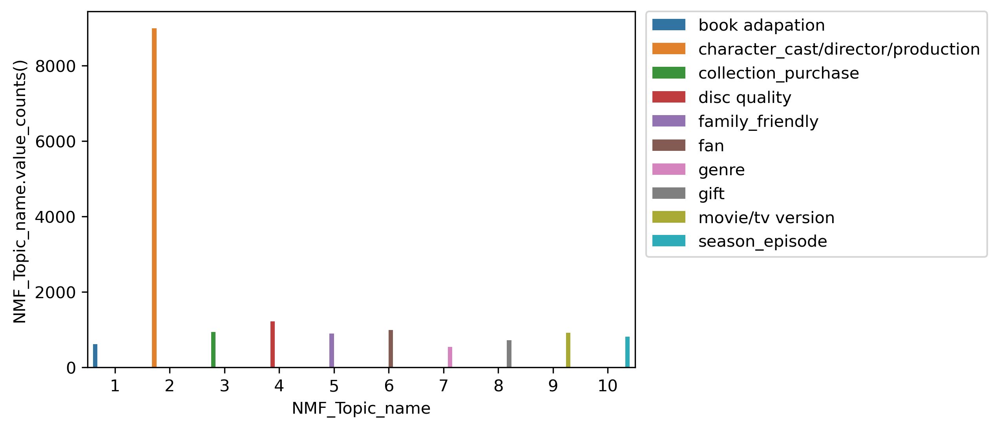

In [291]:
import seaborn as sns
plt.figure(dpi=300)
# fig, ax =plt.subplots()
labels=["book adapation", "character_cast/director/production",'collection_purchase','disc quality',
'family_friendly','fan','genre','gift','movie/tv version','season_episode']
g=sns.barplot(topic_distribution['NMF_Topic_name'],topic_distribution["NMF_Topic_name.value_counts()"],hue=topic_distribution['NMF_Topic_name'],hue_order=labels)
# ax.set_xaxis([0,1,2,3,4,5,6,7,8,9])
# plt.legend(["book adapation", "character_cast/director/production",'collection_purchase','disc quality',
#            'family_friendly','fan','genre','gift','movie/tv version','season_episode'])
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
g.set_xticks(range(10))
  
# set the labels
g.set_xticklabels(['1', '2', '3', '4','5', '6', '7', '8','9','10'])

/Users/Layla/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(0.0, 10000.0)

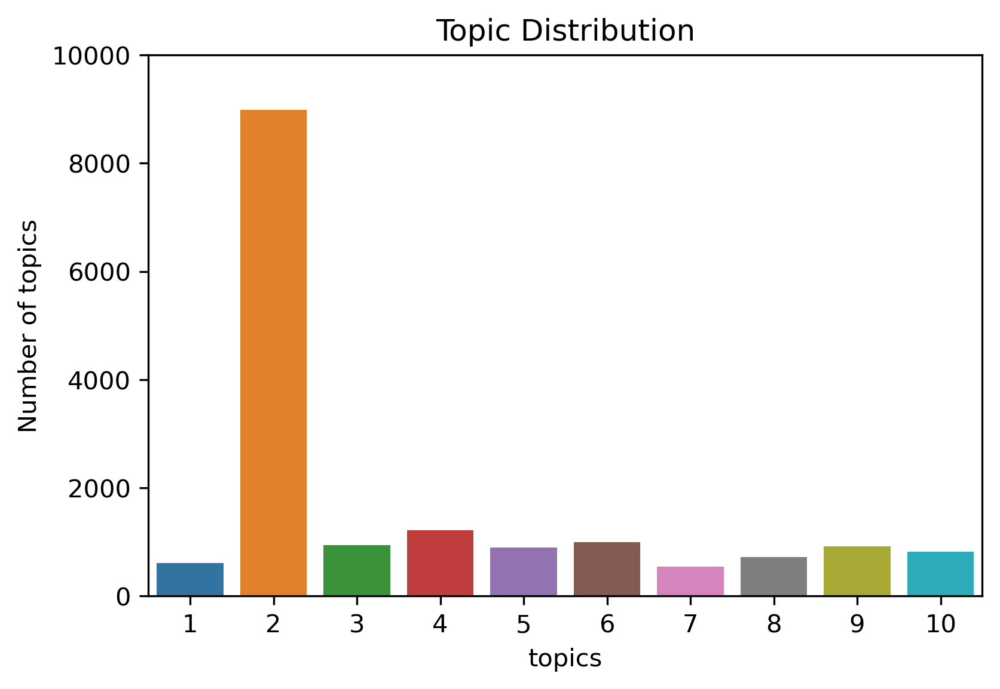

In [302]:
plt.figure(dpi=300)
# fig, ax =plt.subplots()
labels=["book adapation", "character_cast/director/production",'collection_purchase','disc quality',
'family_friendly','fan','genre','gift','movie/tv version','season_episode']
g=sns.barplot(topic_distribution['NMF_Topic_name'],topic_distribution["NMF_Topic_name.value_counts()"])
# ax.set_xaxis([0,1,2,3,4,5,6,7,8,9])
# plt.legend(["book adapation", "character_cast/director/production",'collection_purchase','disc quality',
#            'family_friendly','fan','genre','gift','movie/tv version','season_episode'])
# plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
g.set_xticks(range(10))
  
# set the labels
g.set_xticklabels(['1', '2', '3', '4','5', '6', '7', '8','9','10'])
g.set_xlabel('topics')
g.set_ylabel('Number of topics')
g.set_title('Topic Distribution')
g.set_ylim([0, 10000])


In [296]:
topic_distribution["NMF_Topic_name.value_counts()"]

0     611
1    8984
2     936
3    1217
4     898
5     990
6     539
7     720
8     923
9     815
Name: NMF_Topic_name.value_counts(), dtype: int64

## CorEx

In [20]:
from corextopic import corextopic as ct

words = list(np.asarray(vectorizer.get_feature_names()))

topic_model = ct.Corex(n_hidden= 4, ### YOUR NUMBER OF TOPICS HERE
                       words=words,  ### YOUR VOCABULARY HERE
                       seed=1
                       )

topic_model.fit(doc_term,          ### YOUR DOCUMENT TERM MATRIX HERE
                words= words,      ### YOUR VOCABULARY HERE
                docs= df.pos_review  ### YOUR DOCUMENT SERIES HERE
                );

topics = topic_model.get_topics()
for n,topic in enumerate(topics):
    topic_words,_,_ = zip(*topic)
    print(f'{n}: {", ".join(topic_words)}')

0: collection, man, scene, life, character, woman, death, director, dvd, season
1: workout, cardio, instructor, yoga, exercise, veil, beginner, absurdist, potato, pound
2: absurd, quothe, quest, que, qualify, proposal, prolific, program, produce, print
3: abomination, prude, promos, programming, printing, primary, preview, premiere, pregnant, preference


In [24]:
words = list(np.asarray(vectorizer.get_feature_names()))

topic_model = ct.Corex(n_hidden= 10, ### YOUR NUMBER OF TOPICS HERE
                       words=words,  ### YOUR VOCABULARY HERE
                       seed=1
                       )

topic_model.fit(doc_term,          ### YOUR DOCUMENT TERM MATRIX HERE
                words= words,      ### YOUR VOCABULARY HERE
                docs= df.pos_review  ### YOUR DOCUMENT SERIES HERE
                );

topics = topic_model.get_topics()
for n,topic in enumerate(topics):
    topic_words,_,_ = zip(*topic)
    print(f'{n}: {", ".join(topic_words)}')

0: collection, man, scene, life, character, woman, death, director, dvd, season
1: absurdist, predictability, preparation, present, preserve, pretty, proposal, quo, poll, raft
2: accompany, produce, professional, prominence, quieter, quot, rarity, reading, ready, recount
3: afraid, percent, phase, pie, pin, ppv, qualify, rant, recall, recognize
4: advent, peer, pianist, pic, pint, pioneer, playwright, pleasant, pollution, premium
5: aficionado, plastic, plight, politician, popcorn, portion, potato, potter, pre, preference
6: accurate, pizza, plush, poke, porno, posture, predict, probability, programming, pastime
7: adultery, primary, programmer, promos, proper, prophet, proud, prude, publishing, preview
8: adventure, nobrainer, oldschool, otherthis, overpopulation, particular, pastand, pastor, penultimate, performence
9: addition, past, penny, plain, playground, poignant, posterity, pray, predecessor, pregnant


## LDA

In [21]:
from gensim import corpora, models, matutils
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

term_doc = doc_term.transpose()
corpus = matutils.Sparse2Corpus(term_doc)
id2word = dict((v, k) for k, v in vectorizer.vocabulary_.items())
lda = models.LdaModel(corpus=corpus, num_topics=4, id2word=id2word, passes=10)
lda.print_topics()

2022-09-06 16:07:13,956 : INFO : using symmetric alpha at 0.25
2022-09-06 16:07:13,957 : INFO : using symmetric eta at 0.25
2022-09-06 16:07:13,957 : INFO : using serial LDA version on this node
2022-09-06 16:07:13,960 : INFO : running online (multi-pass) LDA training, 4 topics, 10 passes over the supplied corpus of 16633 documents, updating model once every 2000 documents, evaluating perplexity every 16633 documents, iterating 50x with a convergence threshold of 0.001000
2022-09-06 16:07:13,966 : INFO : PROGRESS: pass 0, at document #2000/16633
2022-09-06 16:07:14,402 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:14,404 : INFO : topic #0 (0.250): 0.017*"story" + 0.009*"life" + 0.008*"family" + 0.006*"man" + 0.006*"tv" + 0.005*"actor" + 0.005*"book" + 0.004*"end" + 0.004*"character" + 0.004*"series"
2022-09-06 16:07:14,405 : INFO : topic #1 (0.250): 0.014*"action" + 0.011*"season" + 0.010*"story" + 0.009*"version" + 0.007*"thing" + 0.007*

2022-09-06 16:07:16,858 : INFO : topic #0 (0.250): 0.016*"story" + 0.010*"life" + 0.009*"family" + 0.008*"book" + 0.006*"man" + 0.004*"performance" + 0.004*"world" + 0.004*"war" + 0.004*"character" + 0.004*"fact"
2022-09-06 16:07:16,858 : INFO : topic #1 (0.250): 0.017*"action" + 0.016*"version" + 0.012*"story" + 0.009*"fun" + 0.009*"quality" + 0.008*"music" + 0.008*"line" + 0.007*"price" + 0.006*"thing" + 0.005*"series"
2022-09-06 16:07:16,858 : INFO : topic #2 (0.250): 0.028*"series" + 0.019*"season" + 0.014*"collection" + 0.013*"tv" + 0.012*"fan" + 0.011*"dvd" + 0.008*"love" + 0.008*"recommend" + 0.007*"wait" + 0.007*"story"
2022-09-06 16:07:16,859 : INFO : topic #3 (0.250): 0.010*"story" + 0.008*"character" + 0.007*"plot" + 0.006*"end" + 0.006*"horror" + 0.005*"cast" + 0.005*"series" + 0.005*"scene" + 0.005*"role" + 0.004*"work"
2022-09-06 16:07:16,860 : INFO : topic diff=0.290513, rho=0.353553
2022-09-06 16:07:17,001 : INFO : -8.652 per-word bound, 402.3 perplexity estimate based 

2022-09-06 16:07:18,814 : INFO : topic #2 (0.250): 0.037*"series" + 0.027*"season" + 0.018*"tv" + 0.017*"collection" + 0.015*"fan" + 0.013*"family" + 0.012*"dvd" + 0.010*"love" + 0.010*"episode" + 0.010*"enjoy"
2022-09-06 16:07:18,815 : INFO : topic #3 (0.250): 0.010*"story" + 0.009*"character" + 0.007*"plot" + 0.007*"horror" + 0.006*"end" + 0.005*"scene" + 0.004*"cast" + 0.004*"performance" + 0.004*"work" + 0.004*"man"
2022-09-06 16:07:18,815 : INFO : topic diff=0.212356, rho=0.311339
2022-09-06 16:07:18,822 : INFO : PROGRESS: pass 1, at document #14000/16633
2022-09-06 16:07:19,094 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:19,095 : INFO : topic #0 (0.250): 0.016*"story" + 0.010*"life" + 0.008*"book" + 0.006*"family" + 0.005*"man" + 0.005*"world" + 0.005*"character" + 0.004*"performance" + 0.004*"war" + 0.004*"actor"
2022-09-06 16:07:19,096 : INFO : topic #1 (0.250): 0.020*"version" + 0.020*"action" + 0.012*"story" + 0.011*"quality" 

2022-09-06 16:07:20,708 : INFO : PROGRESS: pass 2, at document #10000/16633
2022-09-06 16:07:20,955 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:20,957 : INFO : topic #0 (0.250): 0.016*"story" + 0.010*"life" + 0.007*"book" + 0.006*"world" + 0.006*"man" + 0.005*"family" + 0.005*"war" + 0.004*"character" + 0.004*"history" + 0.004*"fact"
2022-09-06 16:07:20,957 : INFO : topic #1 (0.250): 0.021*"version" + 0.020*"action" + 0.014*"story" + 0.013*"quality" + 0.010*"price" + 0.009*"fun" + 0.009*"line" + 0.009*"music" + 0.008*"release" + 0.007*"sound"
2022-09-06 16:07:20,958 : INFO : topic #2 (0.250): 0.044*"series" + 0.036*"season" + 0.022*"tv" + 0.020*"collection" + 0.017*"family" + 0.016*"fan" + 0.014*"episode" + 0.013*"dvd" + 0.011*"enjoy" + 0.011*"love"
2022-09-06 16:07:20,958 : INFO : topic #3 (0.250): 0.009*"story" + 0.009*"character" + 0.007*"plot" + 0.007*"horror" + 0.006*"end" + 0.005*"scene" + 0.005*"life" + 0.005*"performance" + 0.00

2022-09-06 16:07:22,672 : INFO : topic #2 (0.250): 0.049*"series" + 0.038*"season" + 0.025*"tv" + 0.021*"family" + 0.020*"collection" + 0.016*"fan" + 0.016*"episode" + 0.013*"dvd" + 0.012*"enjoy" + 0.011*"recommend"
2022-09-06 16:07:22,673 : INFO : topic #3 (0.250): 0.010*"story" + 0.009*"character" + 0.007*"plot" + 0.006*"end" + 0.006*"horror" + 0.005*"scene" + 0.005*"action" + 0.005*"life" + 0.005*"kind" + 0.004*"cast"
2022-09-06 16:07:22,673 : INFO : topic diff=0.168986, rho=0.284942
2022-09-06 16:07:22,680 : INFO : PROGRESS: pass 3, at document #8000/16633
2022-09-06 16:07:22,912 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:22,914 : INFO : topic #0 (0.250): 0.016*"story" + 0.010*"life" + 0.007*"book" + 0.006*"world" + 0.006*"man" + 0.005*"war" + 0.005*"family" + 0.004*"history" + 0.004*"fact" + 0.004*"character"
2022-09-06 16:07:22,914 : INFO : topic #1 (0.250): 0.022*"version" + 0.021*"action" + 0.015*"quality" + 0.012*"story" + 0.0

2022-09-06 16:07:24,314 : INFO : topic diff=0.159645, rho=0.274034
2022-09-06 16:07:24,321 : INFO : PROGRESS: pass 4, at document #4000/16633
2022-09-06 16:07:24,551 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:24,552 : INFO : topic #0 (0.250): 0.017*"story" + 0.010*"life" + 0.007*"book" + 0.006*"world" + 0.006*"man" + 0.005*"history" + 0.005*"war" + 0.005*"family" + 0.004*"fact" + 0.004*"music"
2022-09-06 16:07:24,553 : INFO : topic #1 (0.250): 0.023*"action" + 0.021*"version" + 0.016*"quality" + 0.012*"story" + 0.010*"price" + 0.010*"fun" + 0.009*"release" + 0.009*"music" + 0.009*"line" + 0.009*"sound"
2022-09-06 16:07:24,553 : INFO : topic #2 (0.250): 0.052*"series" + 0.038*"season" + 0.026*"tv" + 0.022*"collection" + 0.021*"family" + 0.017*"fan" + 0.016*"episode" + 0.015*"dvd" + 0.013*"enjoy" + 0.011*"love"
2022-09-06 16:07:24,554 : INFO : topic #3 (0.250): 0.010*"story" + 0.008*"character" + 0.007*"plot" + 0.007*"horror" + 0.006*"en

2022-09-06 16:07:26,169 : INFO : topic #1 (0.250): 0.022*"version" + 0.021*"action" + 0.017*"quality" + 0.012*"story" + 0.011*"price" + 0.010*"release" + 0.010*"disc" + 0.010*"music" + 0.009*"fun" + 0.009*"sound"
2022-09-06 16:07:26,170 : INFO : topic #2 (0.250): 0.054*"series" + 0.038*"season" + 0.030*"tv" + 0.023*"collection" + 0.022*"family" + 0.017*"fan" + 0.017*"dvd" + 0.015*"episode" + 0.012*"enjoy" + 0.011*"love"
2022-09-06 16:07:26,170 : INFO : topic #3 (0.250): 0.009*"story" + 0.008*"character" + 0.008*"horror" + 0.007*"plot" + 0.006*"action" + 0.005*"end" + 0.005*"scene" + 0.005*"cast" + 0.004*"work" + 0.004*"kind"
2022-09-06 16:07:26,170 : INFO : topic diff=0.181023, rho=0.274034
2022-09-06 16:07:26,177 : INFO : PROGRESS: pass 5, at document #2000/16633
2022-09-06 16:07:26,403 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:26,405 : INFO : topic #0 (0.250): 0.017*"story" + 0.010*"life" + 0.007*"book" + 0.006*"world" + 0.006*"man"

2022-09-06 16:07:27,852 : INFO : topic diff=0.136624, rho=0.264291
2022-09-06 16:07:27,860 : INFO : PROGRESS: pass 5, at document #16000/16633
2022-09-06 16:07:28,082 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:28,083 : INFO : topic #0 (0.250): 0.017*"story" + 0.010*"life" + 0.008*"book" + 0.007*"world" + 0.006*"man" + 0.006*"war" + 0.005*"performance" + 0.005*"history" + 0.005*"family" + 0.004*"music"
2022-09-06 16:07:28,084 : INFO : topic #1 (0.250): 0.025*"version" + 0.020*"action" + 0.018*"quality" + 0.012*"story" + 0.011*"price" + 0.010*"release" + 0.010*"fun" + 0.009*"copy" + 0.009*"line" + 0.009*"sound"
2022-09-06 16:07:28,084 : INFO : topic #2 (0.250): 0.056*"series" + 0.039*"season" + 0.028*"tv" + 0.023*"collection" + 0.022*"family" + 0.017*"fan" + 0.016*"episode" + 0.015*"dvd" + 0.013*"enjoy" + 0.012*"recommend"
2022-09-06 16:07:28,084 : INFO : topic #3 (0.250): 0.009*"story" + 0.008*"character" + 0.008*"plot" + 0.007*"horror"

2022-09-06 16:07:29,638 : INFO : topic #1 (0.250): 0.024*"version" + 0.020*"action" + 0.018*"quality" + 0.012*"story" + 0.012*"price" + 0.011*"release" + 0.009*"copy" + 0.009*"music" + 0.009*"picture" + 0.008*"fun"
2022-09-06 16:07:29,638 : INFO : topic #2 (0.250): 0.057*"series" + 0.039*"season" + 0.029*"tv" + 0.024*"collection" + 0.022*"family" + 0.018*"fan" + 0.017*"episode" + 0.015*"dvd" + 0.015*"enjoy" + 0.011*"love"
2022-09-06 16:07:29,639 : INFO : topic #3 (0.250): 0.009*"story" + 0.008*"character" + 0.008*"plot" + 0.007*"horror" + 0.006*"end" + 0.005*"action" + 0.005*"scene" + 0.005*"guy" + 0.004*"kind" + 0.004*"work"
2022-09-06 16:07:29,639 : INFO : topic diff=0.129726, rho=0.255517
2022-09-06 16:07:29,646 : INFO : PROGRESS: pass 6, at document #14000/16633
2022-09-06 16:07:29,860 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:29,861 : INFO : topic #0 (0.250): 0.016*"story" + 0.011*"life" + 0.008*"book" + 0.006*"world" + 0.006*"ma

2022-09-06 16:07:31,172 : INFO : topic #3 (0.250): 0.009*"story" + 0.008*"character" + 0.008*"plot" + 0.007*"horror" + 0.006*"end" + 0.006*"action" + 0.005*"scene" + 0.005*"guy" + 0.005*"kind" + 0.004*"work"
2022-09-06 16:07:31,173 : INFO : topic diff=0.125926, rho=0.247563
2022-09-06 16:07:31,179 : INFO : PROGRESS: pass 7, at document #10000/16633
2022-09-06 16:07:31,390 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:31,391 : INFO : topic #0 (0.250): 0.016*"story" + 0.010*"life" + 0.007*"book" + 0.006*"world" + 0.006*"man" + 0.006*"war" + 0.005*"history" + 0.005*"performance" + 0.004*"family" + 0.004*"music"
2022-09-06 16:07:31,392 : INFO : topic #1 (0.250): 0.026*"version" + 0.020*"action" + 0.019*"quality" + 0.013*"price" + 0.013*"story" + 0.012*"release" + 0.009*"picture" + 0.009*"music" + 0.009*"copy" + 0.009*"fun"
2022-09-06 16:07:31,392 : INFO : topic #2 (0.250): 0.057*"series" + 0.042*"season" + 0.029*"tv" + 0.023*"collection" + 0.

2022-09-06 16:07:32,903 : INFO : topic #0 (0.250): 0.017*"story" + 0.010*"life" + 0.007*"book" + 0.006*"man" + 0.006*"world" + 0.005*"history" + 0.005*"war" + 0.005*"performance" + 0.005*"fact" + 0.004*"character"
2022-09-06 16:07:32,903 : INFO : topic #1 (0.250): 0.024*"version" + 0.022*"action" + 0.019*"quality" + 0.012*"story" + 0.012*"release" + 0.012*"price" + 0.009*"disc" + 0.009*"copy" + 0.009*"fun" + 0.009*"line"
2022-09-06 16:07:32,904 : INFO : topic #2 (0.250): 0.058*"series" + 0.042*"season" + 0.031*"tv" + 0.024*"family" + 0.023*"collection" + 0.019*"episode" + 0.017*"fan" + 0.015*"dvd" + 0.014*"enjoy" + 0.012*"recommend"
2022-09-06 16:07:32,904 : INFO : topic #3 (0.250): 0.010*"story" + 0.009*"character" + 0.008*"plot" + 0.006*"horror" + 0.006*"end" + 0.006*"action" + 0.005*"scene" + 0.005*"kind" + 0.005*"guy" + 0.004*"life"
2022-09-06 16:07:32,904 : INFO : topic diff=0.122263, rho=0.240309
2022-09-06 16:07:32,950 : INFO : PROGRESS: pass 8, at document #8000/16633
2022-09-0

2022-09-06 16:07:34,418 : INFO : topic #2 (0.250): 0.058*"series" + 0.040*"season" + 0.032*"tv" + 0.024*"collection" + 0.023*"family" + 0.018*"fan" + 0.017*"episode" + 0.017*"dvd" + 0.013*"enjoy" + 0.011*"love"
2022-09-06 16:07:34,418 : INFO : topic #3 (0.250): 0.009*"story" + 0.008*"character" + 0.008*"plot" + 0.007*"horror" + 0.006*"end" + 0.006*"action" + 0.006*"scene" + 0.005*"guy" + 0.005*"kind" + 0.004*"role"
2022-09-06 16:07:34,418 : INFO : topic diff=0.119423, rho=0.233657
2022-09-06 16:07:34,425 : INFO : PROGRESS: pass 9, at document #4000/16633
2022-09-06 16:07:34,633 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:07:34,634 : INFO : topic #0 (0.250): 0.016*"story" + 0.010*"life" + 0.007*"book" + 0.006*"man" + 0.006*"world" + 0.005*"history" + 0.005*"war" + 0.005*"performance" + 0.005*"music" + 0.004*"fact"
2022-09-06 16:07:34,634 : INFO : topic #1 (0.250): 0.023*"version" + 0.023*"action" + 0.020*"quality" + 0.012*"price" + 0.012*"r

2022-09-06 16:07:36,090 : INFO : PROGRESS: pass 9, at document #16633/16633
2022-09-06 16:07:36,156 : INFO : merging changes from 633 documents into a model of 16633 documents
2022-09-06 16:07:36,158 : INFO : topic #0 (0.250): 0.017*"story" + 0.010*"life" + 0.008*"book" + 0.006*"world" + 0.006*"man" + 0.005*"war" + 0.005*"history" + 0.005*"performance" + 0.005*"music" + 0.004*"character"
2022-09-06 16:07:36,158 : INFO : topic #1 (0.250): 0.024*"version" + 0.021*"action" + 0.020*"quality" + 0.012*"price" + 0.012*"release" + 0.012*"disc" + 0.011*"story" + 0.010*"sound" + 0.010*"copy" + 0.009*"music"
2022-09-06 16:07:36,159 : INFO : topic #2 (0.250): 0.059*"series" + 0.040*"season" + 0.032*"tv" + 0.024*"family" + 0.024*"collection" + 0.017*"dvd" + 0.017*"episode" + 0.017*"fan" + 0.013*"enjoy" + 0.011*"love"
2022-09-06 16:07:36,159 : INFO : topic #3 (0.250): 0.010*"story" + 0.008*"plot" + 0.008*"character" + 0.007*"horror" + 0.006*"action" + 0.006*"end" + 0.006*"scene" + 0.005*"role" + 0.0

[(0,
  '0.017*"story" + 0.010*"life" + 0.008*"book" + 0.006*"world" + 0.006*"man" + 0.005*"war" + 0.005*"history" + 0.005*"performance" + 0.005*"music" + 0.004*"character"'),
 (1,
  '0.024*"version" + 0.021*"action" + 0.020*"quality" + 0.012*"price" + 0.012*"release" + 0.012*"disc" + 0.011*"story" + 0.010*"sound" + 0.010*"copy" + 0.009*"music"'),
 (2,
  '0.059*"series" + 0.040*"season" + 0.032*"tv" + 0.024*"family" + 0.024*"collection" + 0.017*"dvd" + 0.017*"episode" + 0.017*"fan" + 0.013*"enjoy" + 0.011*"love"'),
 (3,
  '0.010*"story" + 0.008*"plot" + 0.008*"character" + 0.007*"horror" + 0.006*"action" + 0.006*"end" + 0.006*"scene" + 0.005*"role" + 0.005*"guy" + 0.005*"kind"')]

In [25]:
term_doc = doc_term.transpose()
corpus = matutils.Sparse2Corpus(term_doc)
id2word = dict((v, k) for k, v in vectorizer.vocabulary_.items())
lda = models.LdaModel(corpus=corpus, num_topics=10, id2word=id2word, passes=10)
lda.print_topics()

2022-09-06 16:16:30,291 : INFO : using symmetric alpha at 0.1
2022-09-06 16:16:30,292 : INFO : using symmetric eta at 0.1
2022-09-06 16:16:30,295 : INFO : using serial LDA version on this node
2022-09-06 16:16:30,303 : INFO : running online (multi-pass) LDA training, 10 topics, 10 passes over the supplied corpus of 16633 documents, updating model once every 2000 documents, evaluating perplexity every 16633 documents, iterating 50x with a convergence threshold of 0.001000
2022-09-06 16:16:30,313 : INFO : PROGRESS: pass 0, at document #2000/16633
2022-09-06 16:16:30,575 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:30,578 : INFO : topic #4 (0.100): 0.012*"season" + 0.011*"series" + 0.011*"episode" + 0.010*"story" + 0.008*"price" + 0.007*"character" + 0.006*"fan" + 0.006*"tv" + 0.005*"man" + 0.005*"life"
2022-09-06 16:16:30,578 : INFO : topic #5 (0.100): 0.012*"story" + 0.008*"action" + 0.008*"cast" + 0.007*"man" + 0.006*"music" + 0.006*"fun

2022-09-06 16:16:31,958 : INFO : PROGRESS: pass 0, at document #14000/16633
2022-09-06 16:16:32,208 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:32,210 : INFO : topic #4 (0.100): 0.028*"season" + 0.019*"episode" + 0.016*"purchase" + 0.012*"series" + 0.010*"buy" + 0.009*"dvd" + 0.009*"glad" + 0.008*"wait" + 0.008*"version" + 0.007*"tape"
2022-09-06 16:16:32,211 : INFO : topic #2 (0.100): 0.011*"world" + 0.008*"cartoon" + 0.008*"series" + 0.007*"actor" + 0.006*"story" + 0.005*"fast" + 0.005*"murder" + 0.005*"season" + 0.004*"school" + 0.004*"group"
2022-09-06 16:16:32,211 : INFO : topic #7 (0.100): 0.044*"series" + 0.024*"collection" + 0.022*"tv" + 0.020*"season" + 0.015*"price" + 0.015*"recommend" + 0.014*"fan" + 0.012*"quality" + 0.011*"fun" + 0.011*"action"
2022-09-06 16:16:32,212 : INFO : topic #8 (0.100): 0.012*"story" + 0.007*"world" + 0.007*"character" + 0.006*"life" + 0.006*"music" + 0.005*"horror" + 0.005*"end" + 0.005*"school" + 

2022-09-06 16:16:33,630 : INFO : topic #2 (0.100): 0.010*"world" + 0.008*"cartoon" + 0.007*"fast" + 0.006*"cute" + 0.006*"concept" + 0.005*"subject" + 0.005*"murder" + 0.005*"travel" + 0.005*"trouble" + 0.005*"series"
2022-09-06 16:16:33,631 : INFO : topic #4 (0.100): 0.050*"season" + 0.020*"episode" + 0.015*"purchase" + 0.013*"series" + 0.012*"dvd" + 0.012*"wait" + 0.011*"tape" + 0.010*"buy" + 0.009*"glad" + 0.009*"version"
2022-09-06 16:16:33,632 : INFO : topic #9 (0.100): 0.011*"story" + 0.008*"life" + 0.007*"man" + 0.006*"scene" + 0.006*"character" + 0.006*"performance" + 0.005*"role" + 0.005*"family" + 0.005*"series" + 0.005*"action"
2022-09-06 16:16:33,632 : INFO : topic #8 (0.100): 0.010*"story" + 0.006*"world" + 0.006*"life" + 0.006*"music" + 0.005*"character" + 0.005*"history" + 0.005*"war" + 0.005*"feel" + 0.005*"thing" + 0.005*"horror"
2022-09-06 16:16:33,633 : INFO : topic #0 (0.100): 0.011*"story" + 0.009*"character" + 0.007*"thing" + 0.007*"life" + 0.007*"horror" + 0.006*

2022-09-06 16:16:35,023 : INFO : topic #1 (0.100): 0.017*"husband" + 0.015*"favorite" + 0.013*"kid" + 0.012*"waste" + 0.010*"money" + 0.010*"star" + 0.009*"humor" + 0.009*"opera" + 0.008*"opinion" + 0.008*"work"
2022-09-06 16:16:35,024 : INFO : topic #8 (0.100): 0.010*"story" + 0.007*"history" + 0.007*"world" + 0.006*"life" + 0.006*"music" + 0.005*"war" + 0.005*"character" + 0.005*"feel" + 0.005*"horror" + 0.004*"end"
2022-09-06 16:16:35,024 : INFO : topic #7 (0.100): 0.048*"series" + 0.028*"collection" + 0.026*"tv" + 0.019*"fan" + 0.018*"price" + 0.017*"quality" + 0.017*"season" + 0.012*"recommend" + 0.011*"fun" + 0.010*"dvd"
2022-09-06 16:16:35,025 : INFO : topic #3 (0.100): 0.065*"story" + 0.028*"line" + 0.019*"book" + 0.017*"gift" + 0.017*"condition" + 0.017*"love" + 0.013*"version" + 0.013*"copy" + 0.012*"ray" + 0.012*"music"
2022-09-06 16:16:35,025 : INFO : topic diff=0.109952, rho=0.297265
2022-09-06 16:16:35,033 : INFO : PROGRESS: pass 2, at document #4000/16633
2022-09-06 16:1

2022-09-06 16:16:36,354 : INFO : topic #8 (0.100): 0.010*"story" + 0.008*"world" + 0.006*"war" + 0.006*"history" + 0.006*"music" + 0.006*"life" + 0.005*"feel" + 0.005*"character" + 0.005*"place" + 0.004*"end"
2022-09-06 16:16:36,355 : INFO : topic #7 (0.100): 0.048*"series" + 0.028*"collection" + 0.025*"tv" + 0.020*"quality" + 0.019*"fan" + 0.018*"price" + 0.015*"recommend" + 0.013*"season" + 0.013*"fun" + 0.009*"release"
2022-09-06 16:16:36,355 : INFO : topic diff=0.089572, rho=0.297265
2022-09-06 16:16:36,362 : INFO : PROGRESS: pass 2, at document #16000/16633
2022-09-06 16:16:36,574 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:36,576 : INFO : topic #8 (0.100): 0.009*"story" + 0.008*"world" + 0.007*"war" + 0.007*"history" + 0.007*"life" + 0.006*"music" + 0.005*"place" + 0.005*"feel" + 0.005*"series" + 0.005*"character"
2022-09-06 16:16:36,577 : INFO : topic #9 (0.100): 0.012*"story" + 0.008*"life" + 0.007*"man" + 0.007*"performance" + 

2022-09-06 16:16:37,624 : INFO : topic #2 (0.100): 0.010*"concept" + 0.009*"cartoon" + 0.009*"fast" + 0.008*"travel" + 0.008*"cute" + 0.007*"homage" + 0.007*"task" + 0.007*"subject" + 0.006*"bomb" + 0.006*"touch"
2022-09-06 16:16:37,624 : INFO : topic diff=0.072157, rho=0.284942
2022-09-06 16:16:37,632 : INFO : PROGRESS: pass 3, at document #10000/16633
2022-09-06 16:16:37,831 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:37,833 : INFO : topic #9 (0.100): 0.012*"story" + 0.009*"life" + 0.007*"character" + 0.007*"man" + 0.006*"performance" + 0.006*"scene" + 0.005*"series" + 0.005*"role" + 0.005*"family" + 0.005*"plot"
2022-09-06 16:16:37,834 : INFO : topic #1 (0.100): 0.017*"waste" + 0.016*"favorite" + 0.016*"husband" + 0.013*"money" + 0.012*"kid" + 0.012*"star" + 0.012*"opinion" + 0.010*"pack" + 0.009*"thank" + 0.008*"opera"
2022-09-06 16:16:37,834 : INFO : topic #6 (0.100): 0.058*"family" + 0.014*"day" + 0.013*"year" + 0.011*"stuff" + 0.

2022-09-06 16:16:38,874 : INFO : PROGRESS: pass 4, at document #4000/16633
2022-09-06 16:16:39,070 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:39,072 : INFO : topic #6 (0.100): 0.063*"family" + 0.014*"entertainment" + 0.013*"day" + 0.012*"person" + 0.011*"night" + 0.011*"worth" + 0.011*"wife" + 0.011*"year" + 0.008*"message" + 0.008*"service"
2022-09-06 16:16:39,072 : INFO : topic #4 (0.100): 0.071*"season" + 0.024*"series" + 0.023*"episode" + 0.019*"purchase" + 0.017*"glad" + 0.017*"wait" + 0.016*"end" + 0.014*"dvd" + 0.013*"buy" + 0.011*"tape"
2022-09-06 16:16:39,072 : INFO : topic #7 (0.100): 0.044*"series" + 0.028*"collection" + 0.024*"tv" + 0.020*"quality" + 0.019*"fan" + 0.017*"price" + 0.013*"release" + 0.012*"fun" + 0.011*"recommend" + 0.011*"dvd"
2022-09-06 16:16:39,073 : INFO : topic #3 (0.100): 0.070*"story" + 0.034*"line" + 0.023*"gift" + 0.022*"condition" + 0.020*"love" + 0.020*"book" + 0.014*"version" + 0.014*"son" + 0.013

2022-09-06 16:16:40,339 : INFO : topic #9 (0.100): 0.012*"story" + 0.009*"life" + 0.008*"man" + 0.007*"character" + 0.007*"performance" + 0.006*"scene" + 0.006*"role" + 0.005*"work" + 0.005*"series" + 0.005*"end"
2022-09-06 16:16:40,340 : INFO : topic #7 (0.100): 0.044*"series" + 0.028*"collection" + 0.023*"tv" + 0.021*"quality" + 0.020*"fan" + 0.017*"price" + 0.014*"recommend" + 0.014*"version" + 0.012*"fun" + 0.011*"release"
2022-09-06 16:16:40,340 : INFO : topic #0 (0.100): 0.011*"horror" + 0.010*"story" + 0.009*"plot" + 0.008*"action" + 0.008*"character" + 0.007*"thing" + 0.006*"match" + 0.006*"actor" + 0.005*"violence" + 0.005*"end"
2022-09-06 16:16:40,340 : INFO : topic #2 (0.100): 0.011*"cartoon" + 0.010*"mistake" + 0.009*"concept" + 0.009*"travel" + 0.008*"cute" + 0.008*"homage" + 0.007*"fast" + 0.007*"health" + 0.007*"teen" + 0.007*"task"
2022-09-06 16:16:40,341 : INFO : topic diff=0.061662, rho=0.274034
2022-09-06 16:16:40,441 : INFO : -9.230 per-word bound, 600.5 perplexity 

2022-09-06 16:16:41,505 : INFO : topic #1 (0.100): 0.018*"waste" + 0.017*"favorite" + 0.017*"husband" + 0.013*"money" + 0.013*"kid" + 0.012*"star" + 0.011*"opinion" + 0.010*"pack" + 0.009*"opera" + 0.009*"thank"
2022-09-06 16:16:41,506 : INFO : topic #3 (0.100): 0.070*"story" + 0.033*"line" + 0.028*"gift" + 0.023*"love" + 0.021*"condition" + 0.021*"book" + 0.017*"version" + 0.017*"son" + 0.014*"ray" + 0.011*"sequel"
2022-09-06 16:16:41,506 : INFO : topic #8 (0.100): 0.008*"story" + 0.008*"world" + 0.008*"war" + 0.008*"history" + 0.006*"music" + 0.006*"feel" + 0.006*"workout" + 0.006*"life" + 0.005*"series" + 0.004*"place"
2022-09-06 16:16:41,506 : INFO : topic diff=0.056145, rho=0.264291
2022-09-06 16:16:41,513 : INFO : PROGRESS: pass 5, at document #12000/16633
2022-09-06 16:16:41,705 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:41,707 : INFO : topic #5 (0.100): 0.031*"action" + 0.019*"comedy" + 0.012*"humor" + 0.012*"cast" + 0.011*"fun

2022-09-06 16:16:42,687 : INFO : topic #0 (0.100): 0.011*"horror" + 0.010*"story" + 0.008*"thing" + 0.008*"character" + 0.008*"action" + 0.008*"plot" + 0.007*"attention" + 0.006*"match" + 0.006*"actor" + 0.006*"end"
2022-09-06 16:16:42,687 : INFO : topic #9 (0.100): 0.012*"story" + 0.009*"life" + 0.008*"man" + 0.007*"character" + 0.006*"scene" + 0.006*"performance" + 0.006*"role" + 0.005*"series" + 0.005*"end" + 0.005*"family"
2022-09-06 16:16:42,688 : INFO : topic diff=0.051586, rho=0.255517
2022-09-06 16:16:42,695 : INFO : PROGRESS: pass 6, at document #6000/16633
2022-09-06 16:16:42,888 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:42,890 : INFO : topic #7 (0.100): 0.042*"series" + 0.028*"collection" + 0.024*"tv" + 0.020*"fan" + 0.020*"quality" + 0.017*"version" + 0.016*"price" + 0.014*"release" + 0.013*"recommend" + 0.013*"dvd"
2022-09-06 16:16:42,891 : INFO : topic #6 (0.100): 0.064*"family" + 0.014*"entertainment" + 0.013*"wife" + 0

2022-09-06 16:16:43,866 : INFO : topic diff=0.052530, rho=0.255517
2022-09-06 16:16:43,965 : INFO : -9.187 per-word bound, 583.0 perplexity estimate based on a held-out corpus of 633 documents with 1959 words
2022-09-06 16:16:43,965 : INFO : PROGRESS: pass 6, at document #16633/16633
2022-09-06 16:16:44,024 : INFO : merging changes from 633 documents into a model of 16633 documents
2022-09-06 16:16:44,026 : INFO : topic #4 (0.100): 0.080*"season" + 0.025*"series" + 0.022*"episode" + 0.020*"glad" + 0.019*"wait" + 0.016*"purchase" + 0.016*"end" + 0.015*"tape" + 0.014*"buy" + 0.012*"tv"
2022-09-06 16:16:44,026 : INFO : topic #2 (0.100): 0.014*"concept" + 0.011*"travel" + 0.009*"cartoon" + 0.009*"task" + 0.009*"homage" + 0.009*"cute" + 0.009*"human" + 0.009*"mistake" + 0.008*"subject" + 0.007*"disney"
2022-09-06 16:16:44,027 : INFO : topic #7 (0.100): 0.041*"series" + 0.029*"collection" + 0.025*"tv" + 0.021*"quality" + 0.019*"fan" + 0.017*"dvd" + 0.017*"price" + 0.017*"version" + 0.014*"re

2022-09-06 16:16:45,206 : INFO : topic #7 (0.100): 0.043*"series" + 0.029*"collection" + 0.024*"tv" + 0.021*"fan" + 0.021*"quality" + 0.020*"version" + 0.018*"price" + 0.016*"dvd" + 0.013*"release" + 0.012*"recommend"
2022-09-06 16:16:45,206 : INFO : topic #6 (0.100): 0.065*"family" + 0.016*"wife" + 0.015*"day" + 0.014*"year" + 0.012*"entertainment" + 0.011*"person" + 0.010*"night" + 0.009*"fun" + 0.009*"service" + 0.009*"stuff"
2022-09-06 16:16:45,207 : INFO : topic #3 (0.100): 0.072*"story" + 0.033*"line" + 0.026*"gift" + 0.024*"love" + 0.022*"book" + 0.020*"condition" + 0.019*"son" + 0.015*"copy" + 0.014*"ray" + 0.011*"music"
2022-09-06 16:16:45,207 : INFO : topic #9 (0.100): 0.013*"story" + 0.009*"life" + 0.008*"character" + 0.007*"man" + 0.006*"role" + 0.006*"scene" + 0.006*"performance" + 0.006*"series" + 0.005*"plot" + 0.005*"end"
2022-09-06 16:16:45,208 : INFO : topic #1 (0.100): 0.020*"favorite" + 0.018*"waste" + 0.018*"kid" + 0.016*"star" + 0.015*"husband" + 0.012*"money" + 0

2022-09-06 16:16:46,314 : INFO : topic #1 (0.100): 0.021*"favorite" + 0.021*"husband" + 0.017*"waste" + 0.014*"kid" + 0.014*"star" + 0.012*"opera" + 0.011*"opinion" + 0.010*"pack" + 0.010*"money" + 0.008*"sale"
2022-09-06 16:16:46,314 : INFO : topic #4 (0.100): 0.082*"season" + 0.026*"series" + 0.025*"episode" + 0.019*"end" + 0.019*"purchase" + 0.018*"wait" + 0.016*"glad" + 0.014*"buy" + 0.013*"tape" + 0.010*"tv"
2022-09-06 16:16:46,314 : INFO : topic #5 (0.100): 0.036*"action" + 0.017*"comedy" + 0.014*"cast" + 0.013*"storyline" + 0.012*"funny" + 0.012*"humor" + 0.010*"excellent" + 0.010*"daughter" + 0.009*"story" + 0.008*"flick"
2022-09-06 16:16:46,315 : INFO : topic diff=0.046656, rho=0.240309
2022-09-06 16:16:46,322 : INFO : PROGRESS: pass 8, at document #8000/16633
2022-09-06 16:16:46,503 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:46,505 : INFO : topic #7 (0.100): 0.043*"series" + 0.027*"collection" + 0.024*"tv" + 0.021*"quality" +

2022-09-06 16:16:47,419 : INFO : topic #7 (0.100): 0.040*"series" + 0.029*"collection" + 0.025*"tv" + 0.021*"quality" + 0.019*"fan" + 0.019*"version" + 0.018*"dvd" + 0.017*"price" + 0.014*"release" + 0.013*"disc"
2022-09-06 16:16:47,420 : INFO : topic #4 (0.100): 0.081*"season" + 0.026*"series" + 0.022*"episode" + 0.020*"glad" + 0.019*"wait" + 0.017*"purchase" + 0.016*"end" + 0.015*"tape" + 0.014*"buy" + 0.012*"tv"
2022-09-06 16:16:47,420 : INFO : topic diff=0.064044, rho=0.240309
2022-09-06 16:16:47,426 : INFO : PROGRESS: pass 9, at document #2000/16633
2022-09-06 16:16:47,600 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:47,602 : INFO : topic #3 (0.100): 0.077*"story" + 0.034*"line" + 0.027*"love" + 0.023*"gift" + 0.020*"book" + 0.019*"condition" + 0.017*"son" + 0.015*"ray" + 0.015*"copy" + 0.011*"sequel"
2022-09-06 16:16:47,603 : INFO : topic #1 (0.100): 0.022*"husband" + 0.021*"favorite" + 0.015*"kid" + 0.015*"waste" + 0.014*"star" + 

2022-09-06 16:16:48,536 : INFO : topic diff=0.046886, rho=0.233657
2022-09-06 16:16:48,543 : INFO : PROGRESS: pass 9, at document #14000/16633
2022-09-06 16:16:48,718 : INFO : merging changes from 2000 documents into a model of 16633 documents
2022-09-06 16:16:48,720 : INFO : topic #8 (0.100): 0.009*"history" + 0.007*"war" + 0.007*"workout" + 0.007*"world" + 0.007*"story" + 0.006*"feel" + 0.005*"period" + 0.005*"makeup" + 0.004*"dance" + 0.004*"music"
2022-09-06 16:16:48,721 : INFO : topic #1 (0.100): 0.020*"favorite" + 0.018*"kid" + 0.017*"waste" + 0.016*"husband" + 0.014*"star" + 0.014*"opinion" + 0.011*"opera" + 0.009*"money" + 0.009*"memory" + 0.009*"sale"
2022-09-06 16:16:48,721 : INFO : topic #0 (0.100): 0.012*"horror" + 0.010*"story" + 0.009*"plot" + 0.008*"action" + 0.007*"thing" + 0.007*"match" + 0.007*"character" + 0.006*"attention" + 0.005*"violence" + 0.005*"end"
2022-09-06 16:16:48,721 : INFO : topic #7 (0.100): 0.042*"series" + 0.028*"collection" + 0.025*"tv" + 0.023*"ver

[(0,
  '0.013*"horror" + 0.010*"story" + 0.009*"plot" + 0.008*"action" + 0.008*"attention" + 0.007*"thing" + 0.007*"character" + 0.007*"match" + 0.006*"end" + 0.005*"gore"'),
 (1,
  '0.021*"favorite" + 0.020*"husband" + 0.016*"kid" + 0.014*"star" + 0.013*"waste" + 0.011*"opera" + 0.010*"opinion" + 0.010*"money" + 0.009*"hip" + 0.008*"sale"'),
 (2,
  '0.013*"concept" + 0.011*"travel" + 0.010*"cartoon" + 0.010*"homage" + 0.009*"task" + 0.009*"mistake" + 0.008*"human" + 0.008*"subject" + 0.007*"cute" + 0.007*"giant"'),
 (3,
  '0.077*"story" + 0.036*"line" + 0.027*"love" + 0.023*"gift" + 0.022*"book" + 0.021*"condition" + 0.017*"son" + 0.017*"ray" + 0.014*"copy" + 0.011*"sequel"'),
 (4,
  '0.082*"season" + 0.026*"series" + 0.022*"episode" + 0.020*"glad" + 0.019*"wait" + 0.016*"purchase" + 0.016*"end" + 0.015*"tape" + 0.014*"buy" + 0.012*"tv"'),
 (5,
  '0.031*"action" + 0.016*"comedy" + 0.013*"cast" + 0.012*"funny" + 0.011*"excellent" + 0.011*"humor" + 0.011*"storyline" + 0.009*"daughter" +